## 关于失速预警问题的思考

#关于失速预警问题的思考

**研究目标：**
尽可能地提前预警时间。

**研究方案：**
采用复杂的神经网络模型对信噪比较低的信号进行“特征提取”，然后实现对故障预测。

**路线一：**
利用TSC（time series classification）问题中的Shapelet类方法。(从数据可视化的结果来看，建立失速团的shapelet很有意义）

参考资料：
[The great time series classification bake off: a review and experimental evaluation of recent algorithmic advances](https://link.springer.com/article/10.1007/s10618-016-0483-9)

**路线二：**
利用LSTM/Conv-LSTM方法按照对应文献方法实现预测。

参考文献：
[Using Machine Learning Tools to Predict Compressor Stall](https://asmedigitalcollection.asme.org/energyresources/article-abstract/142/7/070915/1074869/Using-Machine-Learning-Tools-to-Predict-Compressor?redirectedFrom=fulltext)


**路线三：**
按照异常值监测的思路解决预警问题。

参考博客：
[基于时间序列的异常检测](http://blog.rexking6.top/2018/11/05/%E5%9F%BA%E4%BA%8E%E6%97%B6%E9%97%B4%E5%BA%8F%E5%88%97%E7%9A%84%E5%BC%82%E5%B8%B8%E6%A3%80%E6%B5%8B/)



## 基于预测模型的失速预警区间最大化

预测模型选用LSTM和Conv-LSTM模型

（以95%预测准确率为标准）

### 数据准备、处理、可视化、分析

（生成单变量和多变量数据集）

#### 数据准备

In [ ]:
import pandas as pd
import numpy as np
# 获得文件名列表
import os
path_root =  r'D:/Works of Lab/2020-09-07_失速预警' 
global path_root

file_names = os.listdir(path_root + '/Data_slided/data_processed')
stall_file_names = []
for i in file_names:
    if i[-4:] == '.csv':
        stall_file_names.append(i)
global stall_file_names
print('文件名依次为：{}\n'.format(stall_file_names))

# 挑选实验数据中对研究目标有价值的数据，也即挑选测点/传感器/通道
selected_channels = [11,14,18,20,24,26,10,6]
global selected_channels

# 原始数据失速点列表（原始数据的失速点位置，非平滑后的失速点位置）
stall_points = [1985021, 3768047, 3966533, 3124944, 4505764, 4777483, 5367559, 3363431, \
                3400931, 5062476, 3950028, 4619940, 4713390, 4446155, 4549517, 3570832]
global stall_points
print('原始数据失速点依次为：{}\n'.format(stall_points))

# 文件采样频率
freq_sample = [50000] + [40000]*15
global freq_sample
print('文件采样频率依次为：{}\n'.format(freq_sample))

# 平滑窗尺寸
size_slide_window = [50] + [40]*15
global size_slide_window
print(('滑动窗口尺寸依次为：{}\n'.format(size_slide_window)))

# 平滑数据失速点列表（非原始数据的失速点位置，平滑后的失速点位置）  且每个数据间隔为1ms
stall_points_slided = [int(stall_points[i]/size_slide_window[i]) for i in range(len(stall_points))]
global stall_points_slided
print('平滑数据失速点依次为：{}\n'.format(stall_points_slided))    

# 失速点时间
time_stall_points = [stall_points[i]/freq_sample[i] for i in range(len(stall_points))]
global time_stal_points
print('失速点时间依次为：{}\n'.format(time_stall_points))

# 各个文件中压气机旋转一周的样本点个数
# 如有条件可通过转速计算，但是没有，所以通过分析原始数据得到
# T_rotate = [1460, 1503， 1505， 1452， 1470， 6]


# 数据加载
def load_data(file_number):     # 此处file_number>=1,表示文件序号
    i = file_number-1  # i为文件索引号
    path = path_root + '/Data_slided/data_processed/' + stall_file_names[i]
    df = pd.read_csv(open(path), error_bad_lines=False)
    df.index = selected_channels   # 将原数据的列数标记为新形式的索引名
    return df

# 数据概况
# for file_number in range(1,17):   # fiel_number为文件编号  
#     i = file_number - 1  # i为文件索引号
#     print('第{}个文件（文件名为：{}）对应数据的时序总长为{}，失速点位置为{}，失速点时间为{}s'.format\
#       (file_number, stall_file_names[i], load_data(file_number).shape[1], stall_points[i], time_stall_points[i]))
    


文件名依次为：['Dis_10_stall2.csv', 'Dis_40_stall1.csv', 'Dis_70_stall1.csv', 'injection_distortion0_injected_120slpm_stall1.csv', 'injection_distortion0_injected_50slpm_stall1.csv', 'injection_distortion0_injected_70slpm_stall1.csv', 'injection_distortion10_injected_120slpm_stall1.csv', 'injection_distortion10_injected_50slpm_stall1.csv', 'injection_distortion10_injected_70slpm_stall1.csv', 'injection_distortion40_injected_120slpm_stall1.csv', 'injection_distortion40_injected_50slpm_stall1.csv', 'injection_distortion40_injected_70slpm_stall1.csv', 'injection_distortion70_injected_120slpm_stall1.csv', 'injection_distortion70_injected_50slpm_stall1.csv', 'injection_distortion70_injected_70slpm_stall1.csv', 'uniforminflowtest4.csv']

原始数据失速点依次为：[1985021, 3768047, 3966533, 3124944, 4505764, 4777483, 5367559, 3363431, 3400931, 5062476, 3950028, 4619940, 4713390, 4446155, 4549517, 3570832]

文件采样频率依次为：[50000, 40000, 40000, 40000, 40000, 40000, 40000, 40000, 40000, 40000, 40000, 40000, 40000, 40000,

#### 数据处理
→数据降噪←
LSTM模型旨在对序列全段进行信息提取，但是所得数据在大量区段是不包括失速信息的，针对这类问题，需要考虑的是去除无关信息（降噪），
保留有用，不能指望LSTM大力出奇迹。

结合数据可视化的结果可以看出原始数据的波动幅值与失速峰值具有明显差异，但是噪声过大，平滑数据的噪声明显降低，失速峰值虽有降低但很容易分辨出。
![%E5%8E%9F%E5%A7%8B%E6%95%B0%E6%8D%AE%E4%B8%8E%E5%B9%B3%E6%BB%91%E6%95%B0%E6%8D%AE.png](attachment:%E5%8E%9F%E5%A7%8B%E6%95%B0%E6%8D%AE%E4%B8%8E%E5%B9%B3%E6%BB%91%E6%95%B0%E6%8D%AE.png)

In [ ]:
# 降噪（如果有需要的话）

import matplotlib.pyplot as plt

def denoising(seq):
    plt.plot(range(len(seq)),seq)
    plt.show()
    
    seq_denoised = []
    for i in seq:
        if i <= 


### 生成单变量数据集
从16个失速样本中提取指定某个通道的数据，（参考通道包括：11,14,18,20,24,26,10,6），变量名/通道名为:channel_number

#### 数据特征论证与分析


**论证①**

不同文件代表着不同的实验条件，背后反映的物理过程也不相同，这些实验条件会给各个测点的结果带来“系统设置/原理设置”上的差异。
因此需要从物理原理上对各个文件进行区分，也即分别建模（建立LSTM模型），那么数据集的构建不能跨文件。

**论证②**

所选取的8个测点反映的规律极其相似（测量的是同一个现象）。
但是畸变可能会引起测量上的差异，这种差异体现在：个别测点会因为实验设置的缘故导致失速团先于其他测点出现。
存在差异（实验设置可能导致的差异）的测点数据无法看作是多次重复实验的结果）。
所以“单变量”只能以某一个通道为准，不能跨通道/测点。

**论证③**

结合论证①②，数据集的建立只能依托单个文件的单个通道数据，也即一段时间序列。
在这种条件下，失速预警问题的难点在于如何从一段时间序列中提取诸多标记有不同预警时间的样本序列。
首先，样本序列肯定是全段序列的子序列，子序列长度选取多少合适？ 

答：从工程出发，在已有实验条件下，测点数据的失速特征的出现呈现周期性，该周期正是压气机转动一周所需时间。
那么子序列的绝对时间取T=1/ω。
同时，从LSTM建模的角度，子序列的长度越短LSTM建模越容易，预测速度也更快，但是子序列太短就意味着信息损失严重，不利于预测。
因此数据降维的倍数需要摸索，以能够充分表征失速特征的趋势信息且不增加LSTM建模负担为准。

**结合实例分析**

以文件1（'Dis_10_stall2.csv'）为例，

原始数据采样频率为50kHz，分析如下↓

全段序列总长为：2070000,序列相邻点的时间间隔为0.02ms，压气机旋转一周的时间T=29.2ms（从数据中提取测量得到T=29.2ms，也可以通过T = 1/ω计算），对应的子序列长度为1460。

以window_size=50的平滑窗平滑后得到“采样频率”为1kHz的平滑数据，分析如下↓

全段序列长度变为41400，序列相邻点的时间间隔为1ms，压气机旋转一周的时间T = 1/ω=？，对应的子序列长度为29，凑整取30。

具体见下图：
![%E7%A1%AE%E5%AE%9A%E5%B9%B3%E6%BB%91%E7%AA%97%E5%B0%BA%E5%AF%B8%E5%92%8C%E5%AD%90%E5%BA%8F%E5%88%97%E9%95%BF%E5%BA%A6.png](attachment:%E7%A1%AE%E5%AE%9A%E5%B9%B3%E6%BB%91%E7%AA%97%E5%B0%BA%E5%AF%B8%E5%92%8C%E5%AD%90%E5%BA%8F%E5%88%97%E9%95%BF%E5%BA%A6.png)

那么：

LSTM模型的输入样本/子序列的长度区间可以结合需要灵活选取。

开展针对上述两种数据的LSTM建模：

a) 以对平滑数据（window_size=50)在一个周期下样本点个数作为子序列长度。

b) 不考虑LSTM的计算问题，以原始数据在一个周期下的样本点个数作为子序列长度。

验证阶段先执行a) 方案

**论证④**

子序列长度确定后，子序列从全段序列中何处截取也非常关键，从实验设置和实验安排出发，子序列应该截取自从实验条件开始变化到出现明显出现失速团的区段，这里先假设原始数据全段长正好满足该要求，也即全段序列从开始就包含由实验条件改变带来的“失速征兆信息”。

In [ ]:
# 确定指定文件的指定通道的子序列长度：seq_len
def seq_length(file_number, window_size):
    file_index = file_number - 1
    # 旋转一周的绝对时间*平滑后的“采样频率”
    seq_len = int(0.0292*(freq_sample[file_index]/window_size))
    return seq_len
seq_len = seq_length(1,  50)
print(seq_len)

# 从实验数据来看，采样为50kHz且window_size=50的条件下seq_len可取值为29或30，采样为40kHz且window_size=40条件下seq_len可取值为37或38
# 且通过观察数据发现对于所给文件seq_len的取值在30-40之间，那么后续自动调参环节seq_len的取值范围可以设置为[30,40]

29


#### 数据截取与标记
从某个失速样本的某个通道的数据中提炼整理单变量数据集，（参考通道包括：11,14,18,20,24,26,10,6），变量名/通道名为:channel_number

In [ ]:
# 数据截取与标记（针对单个文件的单个通道建立数据截取函数）
from random import sample
import numpy as np
def seq_extrction(file_number, channel_number, seq_len, sample_size):    
    file_index = file_number-1  # i为文件索引号
    channel_index = selected_channels.index(channel_number)
    df = load_data(file_number)  # 文件DataFrame
    # 结合指定通道channel_number，并将全段序列在失速点截取，保留前段。
    seq_to_stall_point = df.iloc[channel_index,:stall_points_slided[file_index]].tolist()
    # 在截止到失速点的全段序列上随机提取sample_size个子序列 
    # 采样方式一
#     extract_points = sample(range(stall_points_slided[file_index])[stall_points_slided[file_index]-2*seq_len:], sample_size) 
    # 采样方式二
    seq_resampled = range(stall_points_slided[file_index])[stall_points_slided[file_index]-3*seq_len:]
    extract_points = numpy.random.choice(seq_resampled, size=sample_size, replace=True, p=None)

    
    X_list = [seq_to_stall_point[j-seq_len:j] for j in extract_points]
    
    X_3dim = np.reshape(np.array(X_list),(sample_size, seq_len, 1))
    y_2dim = np.array([[stall_points_slided[file_index]-j] for j in extract_points])   # 单位是毫秒ms
    
    # 划分训练集和测试集
    X_train = X_3dim[:int(0.7*sample_size),:,:]
    X_test = X_3dim[int(0.7*sample_size):,:,:]
    y_train = y_2dim[:int(0.7*sample_size),:]
    y_test = y_2dim[int(0.7*sample_size):,:]
    
    print(X_train.shape, '\n', y_train.shape, '\n', X_test.shape, '\n', y_test.shape)
    
    return X_train, y_train, X_test, y_test

X_train, y_train, X_test, y_test = seq_extrction(1, 11, 30, 100)



(70, 30, 1) 
 (70, 1) 
 (30, 30, 1) 
 (30, 1)


In [ ]:
# 
import numpy
a = range(20)
b = numpy.random.choice(a, size=100, replace=True, p=None)
print(b)

[ 9 14 14 19 16 18  9  5  6  6  5 14 15 14  8  7 15 14  8  0  6 19  4  8
  6 16  5  5  0 11 11 10 18 15  5 14  4  5 16  2  3  4  4 18 12 13  6 16
  7 18 13  1 18 18 15 18  5  3 14  4  9  7  1  6 16  1 11  6  8  6  4 15
 17  0  4 10  9  8 15  5  9  2  5  3  0 13 15  5  7  6  7  5  7  0 17  4
 18 12 10 17]


### 生成多变量数据集（重新思考）
从16个失速样本中提取指定某几个通道的数据，（参考通道包括：11,14,18,20,24,26,10,6）

In [ ]:
# 单个样本生成器
def single_sample_generator(file_number, channel_number):   # file_number为文件编号, channel_number表示采样通道/传感器编号
    X,y = data_cut(file_number, rate_cut = 0.9)
    channel_index = X.index.tolist().index(channel_number)
    X_single = X.iloc[channel_index,:].tolist()
    return X_single, yK

# 忽略实验的重复性问题，从16个失速样本中提取指定通道的数据 
from sklearn import preprocessing
def single_dataset_generator(channel_number):    # channel_number表示采样通道/传感器编号（int型）→确定哪个单变量，
    X_single_total = pd.DataFrame(columns=range(max(stall_points_slided)))
    y_total = []
    for file_number in range(1,17):
        X_single, y = single_sample_generator(file_number, channel_number)
        X_single_ = X_single + [0]*(X_single_total.shape[1]-len(X_single))   # 添加0“0”是为了应用Msaking
        X_single_total.loc[file_number] = X_single_
        y_total.append(y)
#     print(X_single_total,y_total)
    
    # 训练集和测试划分、数据升维
    
    X_train = np.dstack([preprocessing.scale(X_single_total.iloc[:8,:])])
    X_test = np.dstack([preprocessing.scale(X_single_total.iloc[8:,:])])
    
    y_train = np.array(y_total[:8]).reshape((8,1))
    y_test = np.array(y_total[8:]).reshape((8,1))
    
#     print(X_train.shape, '\n', X_test.shape, '\n', y_train.shape, '\n', y_test.shape) 
    # (8, 134188, 1) , (8, 134188, 1) , (8, 1) , (8, 1)
    
    # 单独执行该函数并保存单变量数据集时运行变量保存代码，其他情况注释掉
#     np.save(path_root + '\Data_slided\single_channel_data\X_train_' + str(channel_number) + '.npy', X_train)
#     np.save(path_root + '\Data_slided\single_channel_data\y_train_' + str(channel_number) + '.npy', y_train)
#     np.save(path_root + '\Data_slided\single_channel_data\X_test_' + str(channel_number) + '.npy', X_test)
#     np.save(path_root + '\Data_slided\single_channel_data\y_test_' + str(channel_number) + '.npy', y_test)
    
    return X_train, y_train, X_test, y_test

# X_train, y_train, X_test, y_test = single_dataset_generator(11)


In [ ]:
#  多变量 = 多通道 = 多个传感器（一般认为变量之间相互独立）
# 直接提取通道[11,14,18,20,24,26,10,6]数据


# 多通道整合，基于单变量数据集进行数据堆叠
def multi_dataset_generator(selected_channel_):
    
    list_train_X = []
    list_test_X = []

    for channel_number in selected_channel_:
        X_train, y_train, X_test, y_test = single_dataset_generator(channel_number)
        X_train = np.squeeze(X_train)  # 删除多余的维度
        X_test = np.squeeze(X_test)
        
        list_train_X.append(X_train)  # 将数据汇总为列表
        list_test_X.append(X_test)
        
    X_train = np.stack(tuple(list_train_X),axis=2)
    X_test = np.stack(tuple(list_test_X),axis=2)
    
    print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)
    
    # 数据保存
    np.save(path_root + '\Data_slided\multi_channel_data\X_train_multi.npy', X_train)
    np.save(path_root + '\Data_slided\multi_channel_data\y_train_multi.npy', y_train)
    np.save(path_root + '\Data_slided\multi_channel_data\X_test_multi.npy', X_test)
    np.save(path_root + '\Data_slided\multi_channel_data\y_test_multi.npy', y_test)
    
    return X_train, y_train, X_test, y_test

# X_train_multi, y_train_multi, X_test_multi, y_test_multi = multi_dataset_generator(selected_channels)

# 由于生成多变量数据集耗时较长，因此增设多变量数据加载函数
def multi_dataset_load():
    X_train = np.load(path_root + '\Data_slided\multi_channel_data\X_train_multi.npy')
    y_train = np.load(path_root + '\Data_slided\multi_channel_data\y_train_multi.npy')
    X_test = np.load(path_root + '\Data_slided\multi_channel_data\X_test_multi.npy')
    y_test = np.load(path_root + '\Data_slided\multi_channel_data\y_test_multi.npy')
    
    return X_train, y_train, X_test, y_test
X_train_multi, y_train_multi, X_test_multi, y_test_multi = multi_dataset_load()
    

## LSTM模型搭建、训练与验证
（针对单变量和多变量）

### 模型搭建与训练
从16个失速样本中提取指定某个通道的数据，（参考通道包括：11,14,18,20,24,26,10,6），变量名/通道名为:channel_number

(70, 30, 1) 
 (70, 1) 
 (30, 30, 1) 
 (30, 1)
Train on 70 samples, validate on 30 samples
Epoch 1/500
 - 1s - loss: 3033.4871 - val_loss: 2699.7557
Epoch 2/500
 - 0s - loss: 2990.9547 - val_loss: 2665.1574
Epoch 3/500
 - 1s - loss: 2957.0374 - val_loss: 2630.0367
Epoch 4/500
 - 1s - loss: 2915.3636 - val_loss: 2586.7408
Epoch 5/500
 - 1s - loss: 2873.8792 - val_loss: 2550.9727
Epoch 6/500
 - 1s - loss: 2839.7461 - val_loss: 2520.5162
Epoch 7/500
 - 1s - loss: 2809.9618 - val_loss: 2493.4346
Epoch 8/500
 - 0s - loss: 2783.2580 - val_loss: 2468.9251
Epoch 9/500
 - 1s - loss: 2758.9109 - val_loss: 2446.3768
Epoch 10/500
 - 1s - loss: 2736.3533 - val_loss: 2425.3187
Epoch 11/500
 - 1s - loss: 2715.1603 - val_loss: 2405.4081
Epoch 12/500
 - 1s - loss: 2695.0262 - val_loss: 2386.3997
Epoch 13/500
 - 1s - loss: 2675.7323 - val_loss: 2368.1172
Epoch 14/500
 - 1s - loss: 2657.1207 - val_loss: 2350.4321
Epoch 15/500
 - 0s - loss: 2639.0752 - val_loss: 2333.2487
Epoch 16/500
 - 1s - loss: 2621.50

Epoch 138/500
 - 1s - loss: 1347.5518 - val_loss: 1103.8460
Epoch 139/500
 - 0s - loss: 1341.2542 - val_loss: 1097.9627
Epoch 140/500
 - 1s - loss: 1335.0107 - val_loss: 1092.1326
Epoch 141/500
 - 1s - loss: 1328.8212 - val_loss: 1086.3548
Epoch 142/500
 - 1s - loss: 1322.6851 - val_loss: 1080.6292
Epoch 143/500
 - 1s - loss: 1316.6024 - val_loss: 1074.9557
Epoch 144/500
 - 1s - loss: 1310.5725 - val_loss: 1069.3334
Epoch 145/500
 - 1s - loss: 1304.5954 - val_loss: 1063.7630
Epoch 146/500
 - 1s - loss: 1298.6710 - val_loss: 1058.2437
Epoch 147/500
 - 1s - loss: 1292.7989 - val_loss: 1052.7755
Epoch 148/500
 - 1s - loss: 1286.9789 - val_loss: 1047.3579
Epoch 149/500
 - 1s - loss: 1281.2105 - val_loss: 1041.9903
Epoch 150/500
 - 1s - loss: 1275.4936 - val_loss: 1036.6733
Epoch 151/500
 - 1s - loss: 1269.8280 - val_loss: 1031.4059
Epoch 152/500
 - 1s - loss: 1264.2133 - val_loss: 1026.1884
Epoch 153/500
 - 1s - loss: 1258.6495 - val_loss: 1021.0201
Epoch 154/500
 - 0s - loss: 1253.1361 - 

Epoch 278/500
 - 1s - loss: 871.2412 - val_loss: 671.4507
Epoch 279/500
 - 1s - loss: 869.8937 - val_loss: 670.3142
Epoch 280/500
 - 1s - loss: 868.5639 - val_loss: 669.1940
Epoch 281/500
 - 1s - loss: 867.2516 - val_loss: 668.0899
Epoch 282/500
 - 1s - loss: 865.9566 - val_loss: 667.0018
Epoch 283/500
 - 0s - loss: 864.6786 - val_loss: 665.9294
Epoch 284/500
 - 1s - loss: 863.4174 - val_loss: 664.8724
Epoch 285/500
 - 0s - loss: 862.1728 - val_loss: 663.8307
Epoch 286/500
 - 1s - loss: 860.9447 - val_loss: 662.8043
Epoch 287/500
 - 1s - loss: 859.7329 - val_loss: 661.7926
Epoch 288/500
 - 1s - loss: 858.5369 - val_loss: 660.7956
Epoch 289/500
 - 1s - loss: 857.3566 - val_loss: 659.8131
Epoch 290/500
 - 1s - loss: 856.1920 - val_loss: 658.8451
Epoch 291/500
 - 1s - loss: 855.0430 - val_loss: 657.8912
Epoch 292/500
 - 1s - loss: 853.9091 - val_loss: 656.9513
Epoch 293/500
 - 1s - loss: 852.7904 - val_loss: 656.0254
Epoch 294/500
 - 1s - loss: 851.6867 - val_loss: 655.1131
Epoch 295/500


Epoch 420/500
 - 1s - loss: 786.7828 - val_loss: 606.2146
Epoch 421/500
 - 0s - loss: 786.6031 - val_loss: 606.1123
Epoch 422/500
 - 0s - loss: 786.4261 - val_loss: 606.0120
Epoch 423/500
 - 1s - loss: 786.2515 - val_loss: 605.9137
Epoch 424/500
 - 1s - loss: 786.0797 - val_loss: 605.8175
Epoch 425/500
 - 1s - loss: 785.9103 - val_loss: 605.7232
Epoch 426/500
 - 1s - loss: 785.7433 - val_loss: 605.6309
Epoch 427/500
 - 1s - loss: 785.5789 - val_loss: 605.5405
Epoch 428/500
 - 1s - loss: 785.4170 - val_loss: 605.4519
Epoch 429/500
 - 1s - loss: 785.2573 - val_loss: 605.3652
Epoch 430/500
 - 1s - loss: 785.1001 - val_loss: 605.2803
Epoch 431/500
 - 1s - loss: 784.9452 - val_loss: 605.1972
Epoch 432/500
 - 1s - loss: 784.7926 - val_loss: 605.1158
Epoch 433/500
 - 1s - loss: 784.6421 - val_loss: 605.0361
Epoch 434/500
 - 1s - loss: 784.4939 - val_loss: 604.9581
Epoch 435/500
 - 1s - loss: 784.3479 - val_loss: 604.8818
Epoch 436/500
 - 1s - loss: 784.2041 - val_loss: 604.8071
Epoch 437/500


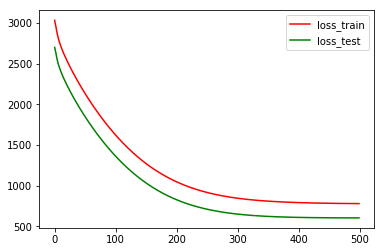

Test MSE: 602.419
Test MAE: 20.700
Test R2: -0.000
Test RMSE: 24.544
Accuracy: 0.133
totally cost 320.0306100845337


In [ ]:
#  
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import sklearn

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Masking
from sklearn import preprocessing
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from math import sqrt,exp
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# from keras.layers import CuDNNLSTM
from tensorflow.compat.v1.keras.layers import CuDNNLSTM
import matplotlib.pyplot as plt
import time
import pytz
from datetime import datetime
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model

import os
os.environ["TF_FORCE_GPU_ALLOW_GROWTH"] = "true"
# from tensorflow.keras.utils.vis_utils import plot_model

def bj_time():
  tz = pytz.timezone('Asia/Shanghai') #东八区
  t = datetime.fromtimestamp(int(time.time()),
    pytz.timezone('Asia/Shanghai')).strftime('%Y_%m_%d__%H_%M_%S %Z%z')
  beijing_time = t[:-9]
  return beijing_time

def Evaluate_Loss(train_X,train_y,test_X,test_y,EPOCHS,LSTM_Cell_numbers):
    
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_y.shape[1]
    
    model = Sequential()
#     model.add(Masking(mask_value=0., input_shape=(n_timesteps, n_features)))   # , padding='post'
    model.add(CuDNNLSTM(LSTM_Cell_numbers, input_shape=(n_timesteps, n_features)))
    # model.add(Dropout(0.5))
    # model.add(Dense(50, activation='relu'))
    model.add(Dense(n_outputs))
    model.compile(loss='mse', optimizer='adam')
    # fit network
    
    history = model.fit(train_X, train_y, epochs=EPOCHS, batch_size=1,\
                      validation_data=(test_X, test_y), verbose=2, shuffle=False)
    print(history.history)

    # plot history
    plt.plot(history.history['loss'], label='loss_train',color='r')
    # plt.plot(history.history['accuracy'], label='accuracy_train',color='b')
    plt.plot(history.history['val_loss'], label='loss_test',color='g')
    # plt.plot(history.history['val_accuracy'], label='accuracy_test',color='p')
    plt.legend()
    plt.savefig(path_root + '/Compresser Stall Problem/Figure/' + bj_time() + '__' + str(EPOCHS) + '__loss_and_val_loss_curve.svg')
    plt.savefig(path_root + '/Compresser Stall Problem/Figure/' + bj_time() + '__' + str(EPOCHS) + '__loss_and_val_loss_curve.png')
    plt.show()

    # save model
    # 保存模型 model.save(file_path)
    model_dir = path_root + '/Compresser Stall Problem'
    LSTM_dir = '{}/model/'.format(model_dir) + bj_time() + '__' + str(EPOCHS) + '__' + 'LSTM_model.h5'
    model.save(LSTM_dir)
    
    # draw the diagram of model topology
    # 保存模型图

    # 需要安装pip install pydot

#     LSTM_plot_dir = '{}/model_Figure/'.format(model_dir) + bj_time() + '__' + str(EPOCHS) + '__' + 'LSTM_model_Figure.png'
#     plot_model(model, to_file=LSTM_plot_dir, show_shapes=True)

    # make a prediction
    pred_y = model.predict(test_X)
    # print(pred_y)
    # calculate MSE、MAE、R2、RSME、offical_score

    mse = mean_squared_error(test_y, pred_y)  # 此处的mse=history.history['val_loss'][-1]
    print('Test MSE: %.3f' % mse)

    mae = mean_absolute_error(test_y, pred_y)    
    print('Test MAE: %.3f' % mae)

    r2 = r2_score(test_y, pred_y)    
    print('Test R2: %.3f' % r2)

    rmse = sqrt(mean_squared_error(test_y, pred_y))    
    print('Test RMSE: %.3f' % rmse)

    count_number = 0
    for i in range(len(pred_y)):
        if abs(pred_y[i]-test_y[i][0]) <=5:
            count_number = count_number + 1
    acc = float(count_number)/len(pred_y)
    print('Accuracy: %.3f' % acc)
    # acc = 0.9
    return rmse, mse, mae, r2, acc 


# global EPOCHS
# channel_number = 11
# X_train, y_train, X_test, y_test = single_dataset_generator(channel_number)
# rmse, mse, mae, r2, acc = Evaluate_Loss(X_train, y_train, X_test, y_test)

def main(file_number, channel_number, seq_len, sample_size,EPOCHS,LSTM_Cell_numbers):
    df_loss = pd.DataFrame(index = ['rmse', 'mse', 'mae', 'r2', 'Acc'])
    X_train, y_train, X_test, y_test = seq_extrction(file_number, channel_number, seq_len, sample_size)
    rmse, mse, mae, r2, acc = Evaluate_Loss(X_train, y_train, X_test, y_test,EPOCHS,LSTM_Cell_numbers)
    df_loss[channel_number] = [rmse, mse, mae, r2, acc]
    df_loss.to_csv(path_root + '/Compresser Stall Problem/loss/' + bj_time() + '__' + str(EPOCHS) + '__LSTM_losses.csv')
    return rmse, mse, mae, r2, acc


time_start=time.time()


# EPOCHS = 500 #  epocha=10,cpu运算需要71秒，gpu加速运算需要12.4秒
rmse, mse, mae, r2, acc = main(file_number=1, channel_number=11, seq_len=30, sample_size=100, EPOCHS=500, LSTM_Cell_numbers=2)

time_end=time.time()
print('totally cost',time_end-time_start)

### 单变量失速预警模型调参记录
|file_number|channel_number|seq_len_resamp|seq_len|sample_size|EPOCHS|upper limit of prediction error|LSTM layer number|LSTM Cell number|time-consuming|val_loss|acc|
|---|---|---|---|---|---|---|---|---|---|
|文件编号|通道编号|采样区间长度|子序列长度|样本个数|迭代次数|预测误差上限/ms|LSTM 层数|LSTM Cell个数|计算耗时/s|验证损失|***预测有效率***|
|1|11|150|30|140|500|5|1|4|427.9||0.119|
|1|11|150|30|140|500|5|1|10|436.2||0.048|
|1|11|150|30|140|500|5|1|2|492.4||0.048|
|1|11|150|30|140|500|5|1|1|462.5||0.095|
|1|11|150|30|140|2000|5|1|1|1972.1||0.024|
|1|11|150|30|140|500|5|1|3|490.2||0.071|
|1|11|120|30|115|500|5|1|2|322.6||0.086|
|1|11|120|30|115|500|5|1|1|306.0||0.086|
|1|11|120|30|115|500|5|1|4|322.7||0.057|
|1|11|90|30|80|500|5|1|4|250.8||0.125|
|1|11|60|30|50|500|5|1|4|148.4||0.2|
|1|11|60|30|50|500|5|1|2|158.2||0.267|
|1|11|30|30|100|150|5|1|2|100.7||0.467|
|1|11|90|60|100|150|5|1|2|320.0||0.133|
|1|11|90|60|100|150|5|1|2||||

### 自动调参优化
目标函数是Evaluate_Loss()
需要优化的参数有LSTM layer number, LSTM Cell number, seq_len/window_size

先保持单层LSTM的结构不变，优化LSTM Cell number和seq_len的最佳取值


(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                                                                                                
Train on 98 samples, validate on 42 samples                                                                            
Epoch 1/300                                                                                                            
 - 3s - loss: 9575.5901 - val_loss: 9018.6423                                                                          

Epoch 2/300                                                                                                            
 - 1s - loss: 9517.4189 - val_loss: 894

Epoch 66/300                                                                                                           
 - 1s - loss: 7027.6813 - val_loss: 6449.4639                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6996.3116 - val_loss: 6417.7786                                                                          

Epoch 68/300                                                                                                           
 - 1s - loss: 6965.0895 - val_loss: 6386.2416                                                                          

Epoch 69/300                                                                                                           
 - 1s - loss: 6934.0144 - val_loss: 6354.8516                                                                          

Epoch 70/300                        

Epoch 133/300                                                                                                          
 - 1s - loss: 5237.7694 - val_loss: 4639.3060                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 5215.6417 - val_loss: 4616.8912                                                                          

Epoch 135/300                                                                                                          
 - 1s - loss: 5193.6424 - val_loss: 4594.6049                                                                          

Epoch 136/300                                                                                                          
 - 1s - loss: 5171.7711 - val_loss: 4572.4472                                                                          

Epoch 137/300                       

Epoch 200/300                                                                                                          
 - 1s - loss: 4022.8161 - val_loss: 3406.2831                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 4008.5177 - val_loss: 3391.7347                                                                          

Epoch 202/300                                                                                                          
 - 1s - loss: 3994.3223 - val_loss: 3377.2883                                                                          

Epoch 203/300                                                                                                          
 - 1s - loss: 3980.2291 - val_loss: 3362.9458                                                                          

Epoch 204/300                       

Epoch 267/300                                                                                                          
 - 1s - loss: 3272.5083 - val_loss: 2640.5827                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3264.1588 - val_loss: 2632.0250                                                                          

Epoch 269/300                                                                                                          
 - 1s - loss: 3255.8815 - val_loss: 2623.5406                                                                          

Epoch 270/300                                                                                                          
 - 1s - loss: 3247.6760 - val_loss: 2615.1297                                                                          

Epoch 271/300                       

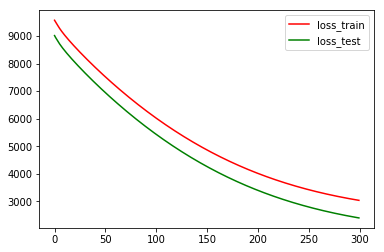

Test MSE: 2394.626                                                                                                     
Test MAE: 40.675                                                                                                       
Test R2: -0.354                                                                                                        
Test RMSE: 48.935                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 30, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 30, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4152.7641 - val_loss: 4428.2156                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4121.6717 - val_loss: 4391.9504                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4090.9172 - val_loss: 4356.0423                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4060.4996 - val_loss: 4320.4881                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4030.4154 - val_loss: 

 - 1s - loss: 2723.3895 - val_loss: 2697.6530                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2710.5481 - val_loss: 2681.0830                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2697.9065 - val_loss: 2664.7363                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2685.4621 - val_loss: 2648.6120                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2673.2132 - val_loss: 

 - 1s - loss: 2205.4040 - val_loss: 1981.8969                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2201.5091 - val_loss: 1975.8040                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2197.6897 - val_loss: 1969.8076                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2193.9447 - val_loss: 1963.9057                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2190.2731 - val_loss: 

 - 1s - loss: 2060.9245 - val_loss: 1728.4030                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2059.9406 - val_loss: 1726.2846                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2058.9773 - val_loss: 1724.1981                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2058.0342 - val_loss: 1722.1436                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2057.1109 - val_loss: 

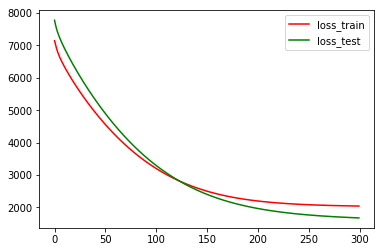

Test MSE: 1669.199                                                                                                     
Test MAE: 34.318                                                                                                       
Test R2: -0.104                                                                                                        
Test RMSE: 40.856                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6520.9770 - val_loss: 4643.5404                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6469.7407 - val_loss: 4603.6164                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6419.0201 - val_loss: 4564.1734                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6368.8132 - val_loss: 4525.2080                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6319.1177 - val_loss: 

 - 1s - loss: 4107.9338 - val_loss: 2898.3155                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4085.5116 - val_loss: 2884.2945                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4063.4204 - val_loss: 2870.5536                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4041.6556 - val_loss: 2857.0902                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4020.2160 - val_loss: 

 - 1s - loss: 3186.0951 - val_loss: 2426.4318                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3179.0124 - val_loss: 2424.3842                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3172.0650 - val_loss: 2422.4262                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3165.2507 - val_loss: 2420.5558                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3158.5661 - val_loss: 

 - 1s - loss: 2922.1870 - val_loss: 2412.1047                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2920.3883 - val_loss: 2412.8940                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2918.6279 - val_loss: 2413.6938                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2916.9045 - val_loss: 2414.5042                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2915.2174 - val_loss: 

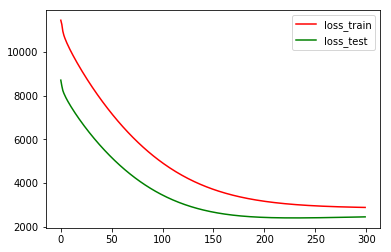

Test MSE: 2444.320                                                                                                     
Test MAE: 43.978                                                                                                       
Test R2: -0.020                                                                                                        
Test RMSE: 49.440                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 8826.6179 - val_loss: 9258.4071                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 8802.2508 - val_loss: 9233.0479                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 8777.9538 - val_loss: 9207.7598                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 8753.7266 - val_loss: 9182.5418                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 8729.5683 - val_loss: 

 - 1s - loss: 7341.3150 - val_loss: 7708.2032                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 7321.3420 - val_loss: 7687.2872                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 7301.4317 - val_loss: 7666.4347                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 7281.5823 - val_loss: 7645.6450                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 7261.7968 - val_loss: 

 - 1s - loss: 6138.6675 - val_loss: 6444.3858                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 6122.7442 - val_loss: 6427.5820                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 6106.8793 - val_loss: 6410.8380                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 6091.0717 - val_loss: 6394.1507                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 6075.3209 - val_loss: 

 - 1s - loss: 5195.0094 - val_loss: 5444.0872                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 5182.7444 - val_loss: 5431.0158                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 5170.5302 - val_loss: 5417.9965                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 5158.3680 - val_loss: 5405.0284                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 5146.2558 - val_loss: 

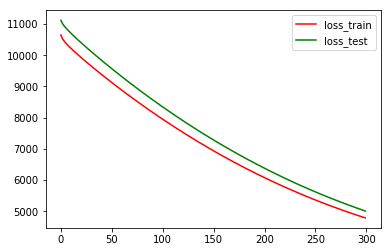

Test MSE: 5005.656                                                                                                     
Test MAE: 57.661                                                                                                       
Test R2: -0.762                                                                                                        
Test RMSE: 70.751                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 31, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 31, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3258.1943 - val_loss: 2647.6356                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3221.5601 - val_loss: 2617.8816                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3185.7609 - val_loss: 2588.9010                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3150.7842 - val_loss: 2560.6824                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3116.6205 - val_loss: 

 - 1s - loss: 2109.4202 - val_loss: 1819.1785                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2104.5778 - val_loss: 1817.0936                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2099.9078 - val_loss: 1815.1322                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2095.4044 - val_loss: 1813.2900                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2091.0627 - val_loss: 

 - 1s - loss: 1988.7016 - val_loss: 1804.5963                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 1988.3330 - val_loss: 1804.9904                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 1987.9788 - val_loss: 1805.3838                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 1987.6387 - val_loss: 1805.7764                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 1987.3110 - val_loss: 

 - 1s - loss: 1979.9189 - val_loss: 1824.3490                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 1979.8939 - val_loss: 1824.5253                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 1979.8698 - val_loss: 1824.6984                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 1979.8466 - val_loss: 1824.8683                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 1979.8244 - val_loss: 

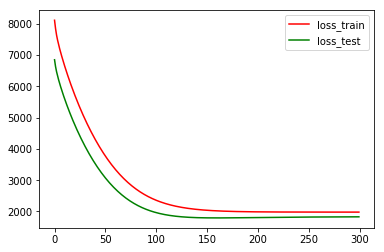

Test MSE: 1829.092                                                                                                     
Test MAE: 37.226                                                                                                       
Test R2: -0.020                                                                                                        
Test RMSE: 42.768                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 30, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 30, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5842.1061 - val_loss: 6239.1780                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5822.1129 - val_loss: 6218.7113                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5802.1911 - val_loss: 6198.3168                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5782.3399 - val_loss: 6177.9934                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5762.5591 - val_loss: 

 - 1s - loss: 4650.4474 - val_loss: 5016.9385                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4634.8410 - val_loss: 5000.8934                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4619.2971 - val_loss: 4984.9100                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4603.8153 - val_loss: 4968.9901                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4588.3953 - val_loss: 

 - 1s - loss: 3737.2362 - val_loss: 4075.4728                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3725.5652 - val_loss: 4063.3988                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3713.9493 - val_loss: 4051.3824                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3702.3889 - val_loss: 4039.4208                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3690.8827 - val_loss: 

 - 1s - loss: 3071.0769 - val_loss: 3383.8252                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3062.8128 - val_loss: 3375.2049                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3054.5957 - val_loss: 3366.6316                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 3046.4247 - val_loss: 3358.1050                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3038.2998 - val_loss: 

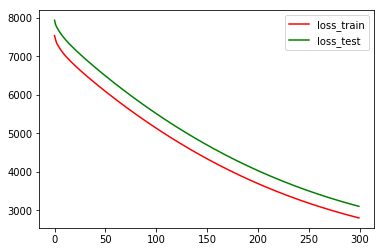

Test MSE: 3101.952                                                                                                     
Test MAE: 45.776                                                                                                       
Test R2: -0.485                                                                                                        
Test RMSE: 55.695                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 35, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 35, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6470.0575 - val_loss: 5712.2053                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6425.3141 - val_loss: 5670.7103                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6380.9449 - val_loss: 5629.5806                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6336.9481 - val_loss: 5588.8143                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6293.3229 - val_loss: 

 - 1s - loss: 4229.6557 - val_loss: 3668.6494                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4206.6929 - val_loss: 3648.2622                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4183.9974 - val_loss: 3628.1329                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4161.5700 - val_loss: 3608.2593                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4139.4081 - val_loss: 

 - 1s - loss: 3193.7051 - val_loss: 2777.9173                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3184.5059 - val_loss: 2770.4556                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3175.4475 - val_loss: 2763.1224                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3166.5281 - val_loss: 2755.9169                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3157.7466 - val_loss: 

 - 1s - loss: 2815.0767 - val_loss: 2490.4734                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2812.0751 - val_loss: 2488.4851                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2809.1264 - val_loss: 2486.5412                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2806.2298 - val_loss: 2484.6401                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2803.3838 - val_loss: 

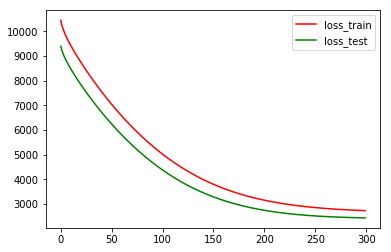

Test MSE: 2441.508                                                                                                     
Test MAE: 43.119                                                                                                       
Test R2: -0.010                                                                                                        
Test RMSE: 49.412                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6700.7410 - val_loss: 6003.2590                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6669.1367 - val_loss: 5974.6915                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6637.6842 - val_loss: 5946.2724                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6606.3821 - val_loss: 5917.9986                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6575.2302 - val_loss: 

 - 1s - loss: 4901.3705 - val_loss: 4398.2001                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4879.1926 - val_loss: 4378.7683                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4857.1463 - val_loss: 4359.4633                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4835.2314 - val_loss: 4340.2838                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4813.4456 - val_loss: 

 - 1s - loss: 3689.0640 - val_loss: 3357.5923                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3674.8951 - val_loss: 3345.7791                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3660.8315 - val_loss: 3334.0644                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3646.8725 - val_loss: 3322.4486                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3633.0194 - val_loss: 

 - 1s - loss: 2952.1467 - val_loss: 2763.1612                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2944.0536 - val_loss: 2756.9499                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2936.0349 - val_loss: 2750.8044                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2928.0896 - val_loss: 2744.7248                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2920.2170 - val_loss: 

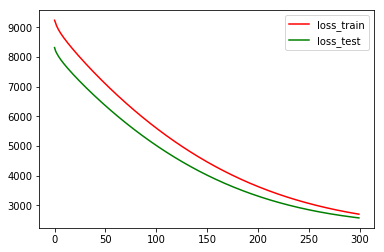

Test MSE: 2578.184                                                                                                     
Test MAE: 41.873                                                                                                       
Test R2: -0.115                                                                                                        
Test RMSE: 50.776                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5299.7911 - val_loss: 5756.9471                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5261.0359 - val_loss: 5714.7186                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5222.6427 - val_loss: 5672.8622                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5184.6099 - val_loss: 5631.3756                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5146.9354 - val_loss: 

 - 1s - loss: 3424.9756 - val_loss: 3673.9796                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3406.7562 - val_loss: 3653.0795                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3388.7821 - val_loss: 3632.4372                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3371.0472 - val_loss: 3612.0487                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3353.5505 - val_loss: 

 - 1s - loss: 2642.8262 - val_loss: 2743.4818                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2636.3798 - val_loss: 2735.3001                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2630.0446 - val_loss: 2727.2426                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2623.8197 - val_loss: 2719.3093                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2617.7022 - val_loss: 

 - 1s - loss: 2390.7398 - val_loss: 2401.9889                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2388.8863 - val_loss: 2399.1634                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2387.0683 - val_loss: 2396.3822                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2385.2851 - val_loss: 2393.6449                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2383.5366 - val_loss: 

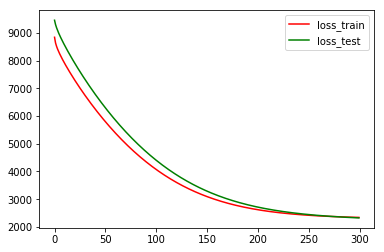

Test MSE: 2323.921                                                                                                     
Test MAE: 41.612                                                                                                       
Test R2: -0.065                                                                                                        
Test RMSE: 48.207                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6018.5804 - val_loss: 4420.2363                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5968.2426 - val_loss: 4383.1012                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5918.4278 - val_loss: 4346.4465                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5869.1329 - val_loss: 4310.2676                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5820.3535 - val_loss: 

 - 1s - loss: 3675.8070 - val_loss: 2854.5718                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3654.5190 - val_loss: 2842.9982                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3633.5629 - val_loss: 2831.6939                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3612.9326 - val_loss: 2820.6544                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3592.6258 - val_loss: 

 - 1s - loss: 2822.2599 - val_loss: 2514.8421                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2815.9870 - val_loss: 2514.2100                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2809.8418 - val_loss: 2513.6506                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2803.8214 - val_loss: 2513.1621                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2797.9236 - val_loss: 

 - 1s - loss: 2596.0344 - val_loss: 2562.9211                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2594.5737 - val_loss: 2564.2339                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2593.1458 - val_loss: 2565.5479                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2591.7500 - val_loss: 2566.8632                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2590.3856 - val_loss: 

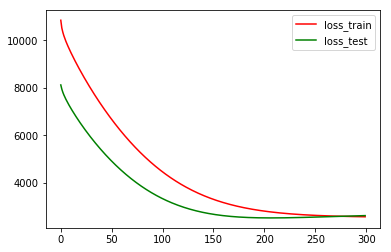

Test MSE: 2609.069                                                                                                     
Test MAE: 43.928                                                                                                       
Test R2: -0.039                                                                                                        
Test RMSE: 51.079                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 30, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 30, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4258.5722 - val_loss: 3548.1686                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4221.8942 - val_loss: 3519.9392                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4185.5880 - val_loss: 3492.0559                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4149.6509 - val_loss: 3464.5165                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4114.0828 - val_loss: 

 - 1s - loss: 2539.0991 - val_loss: 2329.1171                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2523.3302 - val_loss: 2319.6500                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2507.8022 - val_loss: 2310.3856                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2492.5130 - val_loss: 2301.3222                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2477.4614 - val_loss: 

 - 1s - loss: 1905.1464 - val_loss: 2029.9698                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 1900.4924 - val_loss: 2029.0001                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 1895.9340 - val_loss: 2028.0899                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 1891.4683 - val_loss: 2027.2378                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 1887.0950 - val_loss: 

 - 1s - loss: 1738.3930 - val_loss: 2041.9140                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 1737.3323 - val_loss: 2042.6493                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 1736.2956 - val_loss: 2043.3886                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 1735.2826 - val_loss: 2044.1312                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 1734.2928 - val_loss: 

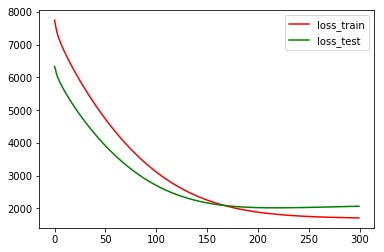

Test MSE: 2068.957                                                                                                     
Test MAE: 39.833                                                                                                       
Test R2: -0.024                                                                                                        
Test RMSE: 45.486                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5911.3712 - val_loss: 6063.4460                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5856.9186 - val_loss: 6005.7726                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5803.1401 - val_loss: 5948.7846                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5750.0308 - val_loss: 5892.4772                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5697.5863 - val_loss: 

 - 1s - loss: 3548.6540 - val_loss: 3515.7841                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3529.6368 - val_loss: 3494.5397                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3510.9824 - val_loss: 3473.6790                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3492.6882 - val_loss: 3453.1947                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3474.7469 - val_loss: 

 - 1s - loss: 2859.1338 - val_loss: 2713.5754                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2854.8429 - val_loss: 2708.1171                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2850.6563 - val_loss: 2702.7754                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2846.5711 - val_loss: 2697.5490                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2842.5852 - val_loss: 

 - 1s - loss: 2718.3771 - val_loss: 2518.4981                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2717.6003 - val_loss: 2517.2031                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2716.8438 - val_loss: 2515.9349                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2716.1067 - val_loss: 2514.6925                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2715.3883 - val_loss: 

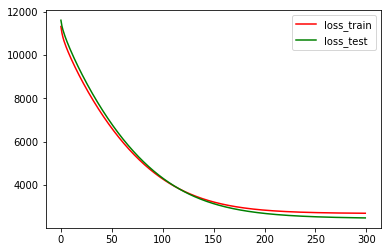

Test MSE: 2485.124                                                                                                     
Test MAE: 41.823                                                                                                       
Test R2: -0.021                                                                                                        
Test RMSE: 49.851                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 34, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 34, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4478.1637 - val_loss: 4335.7583                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4432.7271 - val_loss: 4297.8548                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4387.9391 - val_loss: 4260.5649                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4343.7959 - val_loss: 4223.8830                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4300.2925 - val_loss: 

 - 1s - loss: 2633.3101 - val_loss: 2903.9818                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2620.2008 - val_loss: 2895.4807                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2607.3913 - val_loss: 2887.2318                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2594.8746 - val_loss: 2879.2284                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2582.6460 - val_loss: 

 - 1s - loss: 2201.3240 - val_loss: 2686.7456                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2199.0557 - val_loss: 2686.4686                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2196.8507 - val_loss: 2686.2274                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2194.7081 - val_loss: 2686.0205                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2192.6252 - val_loss: 

 - 1s - loss: 2133.2223 - val_loss: 2704.8059                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2132.9022 - val_loss: 2705.2360                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2132.5913 - val_loss: 2705.6646                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2132.2895 - val_loss: 2706.0916                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2131.9964 - val_loss: 

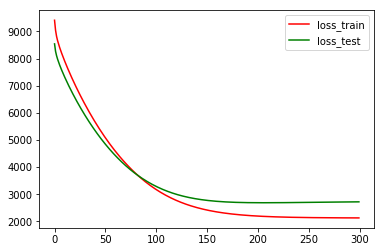

Test MSE: 2718.701                                                                                                     
Test MAE: 45.633                                                                                                       
Test R2: -0.012                                                                                                        
Test RMSE: 52.141                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 31, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 31, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6605.7064 - val_loss: 6169.2568                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6583.9701 - val_loss: 6148.1407                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6562.3039 - val_loss: 6127.0943                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6540.7074 - val_loss: 6106.1163                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6519.1800 - val_loss: 

 - 1s - loss: 5297.4990 - val_loss: 4901.3796                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 5280.1855 - val_loss: 4884.6486                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 5262.9342 - val_loss: 4867.9793                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 5245.7459 - val_loss: 4851.3728                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 5228.6210 - val_loss: 

 - 1s - loss: 4273.5618 - val_loss: 3915.0683                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 4260.3053 - val_loss: 3902.3490                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 4247.1057 - val_loss: 3889.6866                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 4233.9640 - val_loss: 3877.0811                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 4220.8789 - val_loss: 

 - 1s - loss: 3506.9166 - val_loss: 3182.6606                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3497.2532 - val_loss: 3173.4788                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3487.6386 - val_loss: 3164.3444                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 3478.0725 - val_loss: 3155.2575                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3468.5554 - val_loss: 

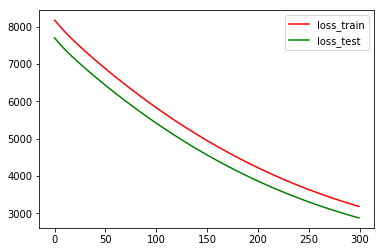

Test MSE: 2881.611                                                                                                     
Test MAE: 43.035                                                                                                       
Test R2: -0.567                                                                                                        
Test RMSE: 53.681                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 7097.4168 - val_loss: 7988.7499                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 7074.7959 - val_loss: 7965.1017                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 7052.2459 - val_loss: 7941.5254                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 7029.7670 - val_loss: 7918.0212                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 7007.3586 - val_loss: 

 - 1s - loss: 5731.3395 - val_loss: 6555.6827                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 5713.1765 - val_loss: 6536.5491                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 5695.0770 - val_loss: 6517.4813                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 5677.0406 - val_loss: 6498.4760                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 5659.0679 - val_loss: 

 - 1s - loss: 4651.5004 - val_loss: 5413.0693                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 4637.4288 - val_loss: 5398.0982                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 4623.4156 - val_loss: 5383.1859                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 4609.4610 - val_loss: 5368.3330                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 4595.5631 - val_loss: 

 - 1s - loss: 3832.1058 - val_loss: 4536.1207                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3821.6884 - val_loss: 4524.8877                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3811.3211 - val_loss: 4513.7078                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 3801.0041 - val_loss: 4502.5784                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3790.7371 - val_loss: 

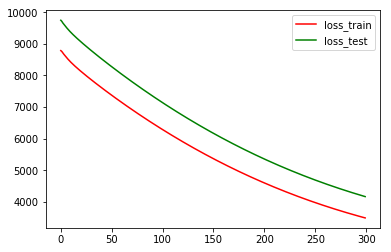

Test MSE: 4163.577                                                                                                     
Test MAE: 54.749                                                                                                       
Test R2: -0.608                                                                                                        
Test RMSE: 64.526                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 32, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 32, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3367.1845 - val_loss: 3163.2462                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3331.8849 - val_loss: 3127.8935                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3297.4927 - val_loss: 3093.4473                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3263.9936 - val_loss: 3059.8890                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3231.3703 - val_loss: 

 - 1s - loss: 2336.0419 - val_loss: 2124.9336                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2332.2597 - val_loss: 2121.0332                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2328.6213 - val_loss: 2117.2776                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2325.1225 - val_loss: 2113.6629                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2321.7574 - val_loss: 

 - 1s - loss: 2245.9931 - val_loss: 2029.4770                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2245.7426 - val_loss: 2029.1815                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2245.5021 - val_loss: 2028.8968                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2245.2714 - val_loss: 2028.6228                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2245.0501 - val_loss: 

 - 1s - loss: 2240.1944 - val_loss: 2021.9605                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2240.1787 - val_loss: 2021.9328                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2240.1637 - val_loss: 2021.9057                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2240.1493 - val_loss: 2021.8796                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2240.1355 - val_loss: 

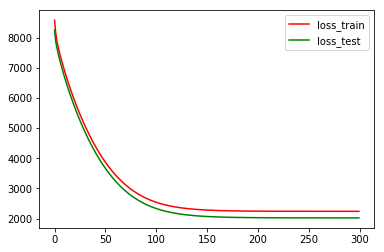

Test MSE: 2021.347                                                                                                     
Test MAE: 39.266                                                                                                       
Test R2: -0.000                                                                                                        
Test RMSE: 44.959                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3432.8244 - val_loss: 4139.1382                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3397.6306 - val_loss: 4095.5199                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3363.2346 - val_loss: 4052.7702                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3329.6252 - val_loss: 4010.8796                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3296.7918 - val_loss: 

 - 1s - loss: 2316.5687 - val_loss: 2621.9591                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2311.6398 - val_loss: 2613.4126                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2306.8789 - val_loss: 2605.0919                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2302.2802 - val_loss: 2596.9904                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2297.8382 - val_loss: 

 - 1s - loss: 2189.1018 - val_loss: 2349.6265                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2188.6746 - val_loss: 2348.0976                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2188.2630 - val_loss: 2346.6032                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2187.8663 - val_loss: 2345.1457                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2187.4844 - val_loss: 

 - 1s - loss: 2178.4359 - val_loss: 2296.4879                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2178.4011 - val_loss: 2296.1406                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2178.3679 - val_loss: 2295.7995                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2178.3359 - val_loss: 2295.4657                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2178.3048 - val_loss: 

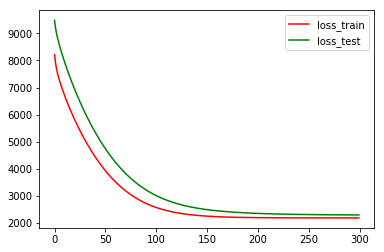

Test MSE: 2287.529                                                                                                     
Test MAE: 40.251                                                                                                       
Test R2: -0.040                                                                                                        
Test RMSE: 47.828                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 35, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 35, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6937.1500 - val_loss: 7749.5353                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6896.2096 - val_loss: 7707.0598                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6855.5266 - val_loss: 7664.8416                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6815.0983 - val_loss: 7622.8819                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6774.9250 - val_loss: 

 - 1s - loss: 4729.6927 - val_loss: 5445.3690                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4704.4683 - val_loss: 5418.8115                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4679.4544 - val_loss: 5392.4662                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4654.6494 - val_loss: 5366.3353                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4630.0522 - val_loss: 

 - 1s - loss: 3460.9586 - val_loss: 4096.0804                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3447.7570 - val_loss: 4081.8232                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3434.6998 - val_loss: 4067.7144                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3421.7868 - val_loss: 4053.7537                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3409.0163 - val_loss: 

 - 1s - loss: 2846.0081 - val_loss: 3420.4910                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2840.2020 - val_loss: 3413.9336                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2834.4738 - val_loss: 3407.4592                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2828.8211 - val_loss: 3401.0649                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2823.2442 - val_loss: 

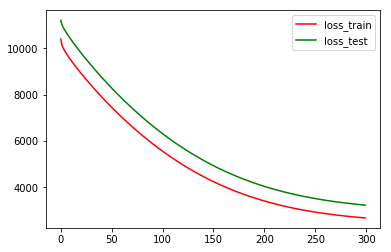

Test MSE: 3230.011                                                                                                     
Test MAE: 50.439                                                                                                       
Test R2: -0.112                                                                                                        
Test RMSE: 56.833                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 35, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 35, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4683.3582 - val_loss: 4696.6896                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4635.4932 - val_loss: 4650.4780                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4588.4123 - val_loss: 4605.0404                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4542.1086 - val_loss: 4560.3684                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4496.5746 - val_loss: 

 - 1s - loss: 2863.5086 - val_loss: 2961.5753                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2852.0293 - val_loss: 2950.9456                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2840.8471 - val_loss: 2940.6020                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2829.9541 - val_loss: 2930.5353                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2819.3439 - val_loss: 

 - 1s - loss: 2510.2688 - val_loss: 2644.5985                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2508.6177 - val_loss: 2643.2485                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2507.0159 - val_loss: 2641.9434                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2505.4629 - val_loss: 2640.6821                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2503.9577 - val_loss: 

 - 1s - loss: 2463.0649 - val_loss: 2609.7435                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2462.8625 - val_loss: 2609.6417                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2462.6663 - val_loss: 2609.5444                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2462.4762 - val_loss: 2609.4519                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2462.2921 - val_loss: 

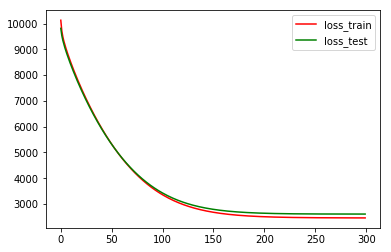

Test MSE: 2608.093                                                                                                     
Test MAE: 45.363                                                                                                       
Test R2: -0.000                                                                                                        
Test RMSE: 51.069                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 32, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 32, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4886.5927 - val_loss: 7155.7316                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4863.2103 - val_loss: 7123.9214                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4839.9665 - val_loss: 7092.2652                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4816.8609 - val_loss: 7060.7624                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4793.8931 - val_loss: 

 - 1s - loss: 3606.2755 - val_loss: 5346.7549                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3591.2705 - val_loss: 5324.4610                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3576.3771 - val_loss: 5302.2989                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3561.5942 - val_loss: 5280.2660                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3546.9215 - val_loss: 

 - 1s - loss: 2825.2505 - val_loss: 4122.9016                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2816.6771 - val_loss: 4108.4553                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2808.1829 - val_loss: 4094.1094                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2799.7677 - val_loss: 4079.8664                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2791.4309 - val_loss: 

 - 1s - loss: 2402.1753 - val_loss: 3356.0535                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2397.8223 - val_loss: 3347.3240                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2393.5159 - val_loss: 3338.6633                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2389.2553 - val_loss: 3330.0665                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2385.0410 - val_loss: 

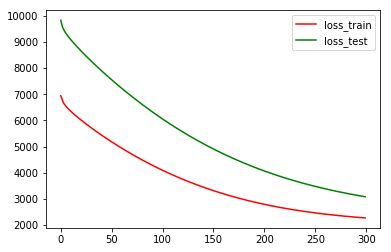

Test MSE: 3081.831                                                                                                     
Test MAE: 45.708                                                                                                       
Test R2: -0.647                                                                                                        
Test RMSE: 55.514                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 9281.1119 - val_loss: 6596.6995                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 9243.7694 - val_loss: 6565.3381                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 9206.5796 - val_loss: 6534.1226                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 9169.5418 - val_loss: 6503.0522                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 9132.6562 - val_loss: 

 - 1s - loss: 7101.8171 - val_loss: 4803.0133                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 7074.0657 - val_loss: 4780.7676                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 7046.4497 - val_loss: 4758.6488                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 7018.9688 - val_loss: 4736.6577                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 6991.6219 - val_loss: 

 - 1s - loss: 5528.2246 - val_loss: 3578.8505                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 5508.9083 - val_loss: 3564.4251                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 5489.7089 - val_loss: 3550.1063                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 5470.6242 - val_loss: 3535.8900                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 5451.6530 - val_loss: 

 - 1s - loss: 4471.4296 - val_loss: 2825.4569                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 4459.0117 - val_loss: 2817.1750                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 4446.6834 - val_loss: 2808.9710                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 4434.4446 - val_loss: 2800.8437                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 4422.2938 - val_loss: 

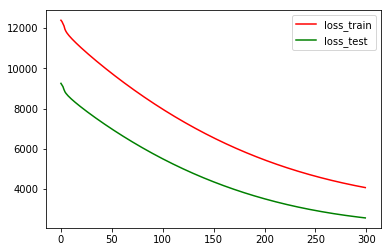

Test MSE: 2572.996                                                                                                     
Test MAE: 40.546                                                                                                       
Test R2: -0.179                                                                                                        
Test RMSE: 50.725                                                                                                      
Accuracy: 0.357                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 8901.8355 - val_loss: 11017.3473                                                                         

Epoch 64/300                                                                                                           
 - 1s - loss: 8877.4417 - val_loss: 10988.4785                                                                         

Epoch 65/300                                                                                                           
 - 1s - loss: 8853.1169 - val_loss: 10959.6812                                                                         

Epoch 66/300                                                                                                           
 - 1s - loss: 8828.8607 - val_loss: 10930.9565                                                                         

Epoch 67/300                                                                                                           
 - 1s - loss: 8804.6732 - val_loss: 

 - 1s - loss: 7413.9921 - val_loss: 9237.1723                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 7393.9748 - val_loss: 9212.9124                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 7374.0194 - val_loss: 9188.7181                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 7354.1267 - val_loss: 9164.5913                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 7334.2974 - val_loss: 

 - 1s - loss: 6208.1760 - val_loss: 7756.0621                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 6192.2021 - val_loss: 7736.1258                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 6176.2868 - val_loss: 7716.2515                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 6160.4278 - val_loss: 7696.4402                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 6144.6270 - val_loss: 

 - 1s - loss: 5260.9616 - val_loss: 6554.0670                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 5248.6404 - val_loss: 6538.1184                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 5236.3696 - val_loss: 6522.2236                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 5224.1518 - val_loss: 6506.3879                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 5211.9846 - val_loss: 

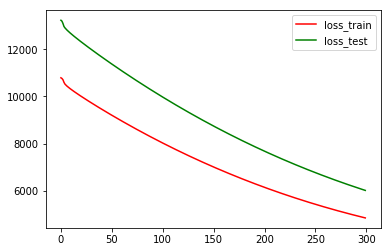

Test MSE: 6014.710                                                                                                     
Test MAE: 65.942                                                                                                       
Test R2: -1.249                                                                                                        
Test RMSE: 77.555                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 38, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 38, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 9622.3048 - val_loss: 8342.7101                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 9584.0388 - val_loss: 8308.9127                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 9545.9264 - val_loss: 8275.2633                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 9507.9678 - val_loss: 8241.7623                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 9470.1610 - val_loss: 

 - 1s - loss: 7382.8345 - val_loss: 6391.5618                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 7354.2130 - val_loss: 6367.0620                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 7325.7259 - val_loss: 6342.6907                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 7297.3742 - val_loss: 6318.4495                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 7269.1585 - val_loss: 

 - 1s - loss: 5753.5876 - val_loss: 5024.3944                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 5733.4898 - val_loss: 5007.9728                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 5713.5102 - val_loss: 4991.6609                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 5693.6466 - val_loss: 4975.4578                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 5673.8980 - val_loss: 

 - 1s - loss: 4648.5131 - val_loss: 4147.9375                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 4635.4453 - val_loss: 4137.9945                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 4622.4683 - val_loss: 4128.1359                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 4609.5852 - val_loss: 4118.3624                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 4596.7931 - val_loss: 

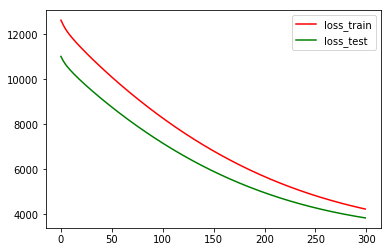

Test MSE: 3839.267                                                                                                     
Test MAE: 50.472                                                                                                       
Test R2: -0.181                                                                                                        
Test RMSE: 61.962                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 9810.2191 - val_loss: 8896.0795                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 9771.4922 - val_loss: 8859.5914                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 9732.9186 - val_loss: 8823.2542                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 9694.4980 - val_loss: 8787.0677                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 9656.2299 - val_loss: 

 - 1s - loss: 7540.1148 - val_loss: 6770.4897                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 7511.0469 - val_loss: 6743.4894                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 7482.1147 - val_loss: 6716.6214                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 7453.3196 - val_loss: 6689.8870                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 7424.6596 - val_loss: 

 - 1s - loss: 5882.1726 - val_loss: 5244.0646                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 5861.6686 - val_loss: 5225.4067                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 5841.2826 - val_loss: 5206.8628                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 5821.0128 - val_loss: 5188.4317                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 5800.8616 - val_loss: 

 - 1s - loss: 4751.8196 - val_loss: 4228.6206                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 4738.4078 - val_loss: 4216.7801                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 4725.0889 - val_loss: 4205.0322                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 4711.8635 - val_loss: 4193.3689                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 4698.7291 - val_loss: 

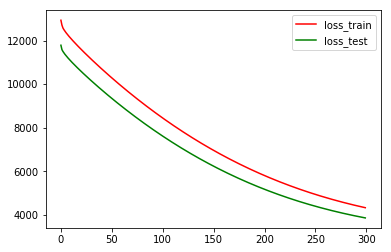

Test MSE: 3855.215                                                                                                     
Test MAE: 52.453                                                                                                       
Test R2: -0.295                                                                                                        
Test RMSE: 62.090                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 8605.3175 - val_loss: 8897.7986                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 8569.4375 - val_loss: 8861.9919                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 8533.7101 - val_loss: 8826.3370                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 8498.1335 - val_loss: 8790.8328                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 8462.7081 - val_loss: 

 - 1s - loss: 6522.4056 - val_loss: 6819.4584                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 6496.0652 - val_loss: 6793.1830                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 6469.8597 - val_loss: 6767.0421                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 6443.7877 - val_loss: 6741.0327                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 6417.8488 - val_loss: 

 - 1s - loss: 5040.4922 - val_loss: 5341.5226                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 5022.4887 - val_loss: 5323.5728                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 5004.5974 - val_loss: 5305.7346                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 4986.8187 - val_loss: 5288.0108                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 4969.1548 - val_loss: 

 - 1s - loss: 4065.8977 - val_loss: 4370.1019                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 4054.6037 - val_loss: 4358.8488                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 4043.3959 - val_loss: 4347.6800                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 4032.2732 - val_loss: 4336.5992                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 4021.2368 - val_loss: 

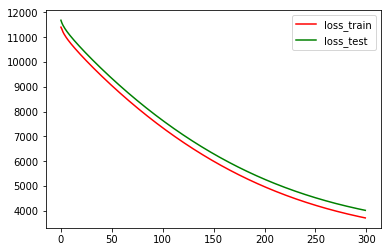

Test MSE: 4015.918                                                                                                     
Test MAE: 53.162                                                                                                       
Test R2: -0.284                                                                                                        
Test RMSE: 63.371                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 9168.3609 - val_loss: 7925.6977                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 9131.1457 - val_loss: 7893.1190                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 9094.0827 - val_loss: 7860.6882                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 9057.1715 - val_loss: 7828.4036                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 9020.4120 - val_loss: 

 - 1s - loss: 6997.7496 - val_loss: 6054.0308                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 6970.1327 - val_loss: 6030.6826                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 6942.6514 - val_loss: 6007.4616                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 6915.3037 - val_loss: 5984.3680                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 6888.0896 - val_loss: 

 - 1s - loss: 5433.4431 - val_loss: 4760.5064                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 5414.2707 - val_loss: 4745.1217                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 5395.2130 - val_loss: 4729.8433                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 5376.2699 - val_loss: 4714.6717                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 5357.4423 - val_loss: 

 - 1s - loss: 4386.1766 - val_loss: 3948.0620                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 4373.8986 - val_loss: 3938.9822                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 4361.7111 - val_loss: 3929.9828                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 4349.6119 - val_loss: 3921.0630                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 4337.6004 - val_loss: 

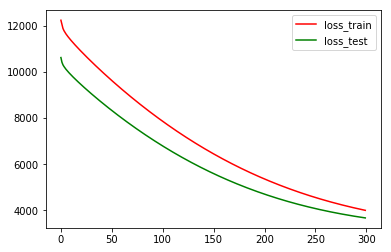

Test MSE: 3668.382                                                                                                     
Test MAE: 50.911                                                                                                       
Test R2: -0.156                                                                                                        
Test RMSE: 60.567                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 34, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 34, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3668.0250 - val_loss: 4146.1270                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3629.6413 - val_loss: 4096.7759                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3592.1986 - val_loss: 4048.4678                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3555.6808 - val_loss: 4001.1870                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3520.0748 - val_loss: 

 - 1s - loss: 2510.9197 - val_loss: 2483.2596                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2506.3642 - val_loss: 2474.3719                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2501.9753 - val_loss: 2465.7257                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2497.7473 - val_loss: 2457.3165                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2493.6754 - val_loss: 

 - 1s - loss: 2399.2140 - val_loss: 2204.2532                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2398.8816 - val_loss: 2202.7135                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2398.5620 - val_loss: 2201.2110                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2398.2552 - val_loss: 2199.7446                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2397.9604 - val_loss: 

 - 1s - loss: 2391.3210 - val_loss: 2151.2642                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2391.2981 - val_loss: 2150.9250                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2391.2766 - val_loss: 2150.5923                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2391.2556 - val_loss: 2150.2670                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2391.2354 - val_loss: 

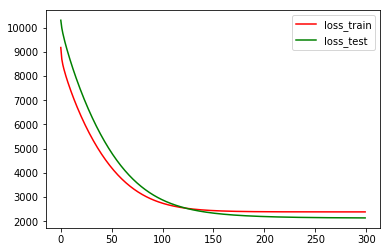

Test MSE: 2142.614                                                                                                     
Test MAE: 39.677                                                                                                       
Test R2: -0.060                                                                                                        
Test RMSE: 46.288                                                                                                      
Accuracy: 0.262                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 9518.0045 - val_loss: 6906.4156                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 9467.9503 - val_loss: 6870.0429                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 9418.1609 - val_loss: 6833.9165                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 9368.6361 - val_loss: 6798.0353                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 9319.3746 - val_loss: 

 - 1s - loss: 6722.5784 - val_loss: 4981.7736                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 6689.0314 - val_loss: 4960.4316                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 6655.7089 - val_loss: 4939.2915                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 6622.6143 - val_loss: 4918.3516                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 6589.7471 - val_loss: 

 - 1s - loss: 4943.5927 - val_loss: 3956.5310                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 4923.6558 - val_loss: 3946.7641                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 4903.8932 - val_loss: 3937.1383                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 4884.3061 - val_loss: 3927.6523                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 4864.8932 - val_loss: 

 - 1s - loss: 3949.9168 - val_loss: 3565.0533                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3939.6224 - val_loss: 3562.4985                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3929.4400 - val_loss: 3560.0183                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 3919.3679 - val_loss: 3557.6116                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3909.4043 - val_loss: 

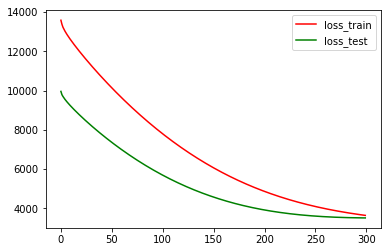

Test MSE: 3513.972                                                                                                     
Test MAE: 51.837                                                                                                       
Test R2: -0.001                                                                                                        
Test RMSE: 59.279                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5744.7332 - val_loss: 4869.6804                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5691.1619 - val_loss: 4821.8170                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5638.3867 - val_loss: 4774.7189                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5586.4008 - val_loss: 4728.3805                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5535.1986 - val_loss: 

 - 1s - loss: 3598.9450 - val_loss: 3031.3016                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3583.8934 - val_loss: 3019.6111                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3569.1825 - val_loss: 3008.2253                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3554.8078 - val_loss: 2997.1406                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3540.7630 - val_loss: 

 - 1s - loss: 3099.0803 - val_loss: 2687.3861                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3096.3807 - val_loss: 2686.1371                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3093.7546 - val_loss: 2684.9415                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3091.1999 - val_loss: 2683.7974                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3088.7136 - val_loss: 

 - 1s - loss: 3016.0907 - val_loss: 2667.8273                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3015.6812 - val_loss: 2667.9799                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3015.2829 - val_loss: 2668.1360                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 3014.8959 - val_loss: 2668.2954                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3014.5199 - val_loss: 

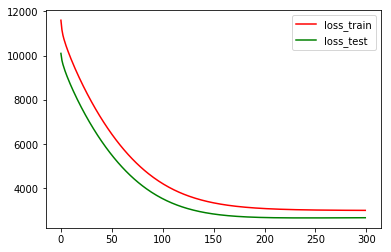

Test MSE: 2674.409                                                                                                     
Test MAE: 45.811                                                                                                       
Test R2: -0.003                                                                                                        
Test RMSE: 51.715                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 38, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 38, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 10691.2679 - val_loss: 8950.1605                                                                         

Epoch 64/300                                                                                                           
 - 1s - loss: 10649.5231 - val_loss: 8912.5654                                                                         

Epoch 65/300                                                                                                           
 - 1s - loss: 10607.9350 - val_loss: 8875.1222                                                                         

Epoch 66/300                                                                                                           
 - 1s - loss: 10566.5016 - val_loss: 8837.8300                                                                         

Epoch 67/300                                                                                                           
 - 1s - loss: 10525.2234 - val_loss:

 - 1s - loss: 8225.7196 - val_loss: 6753.5342                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 8193.8527 - val_loss: 6725.5303                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 8162.1254 - val_loss: 6697.6653                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 8130.5408 - val_loss: 6669.9348                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 8099.0950 - val_loss: 

 - 1s - loss: 6390.5398 - val_loss: 5165.6099                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 6367.5708 - val_loss: 5146.1346                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 6344.7257 - val_loss: 5126.7770                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 6322.0034 - val_loss: 5107.5364                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 6299.4045 - val_loss: 

 - 1s - loss: 5109.7316 - val_loss: 4103.9597                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 5094.3216 - val_loss: 4091.5760                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 5079.0119 - val_loss: 4079.2838                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 5063.8036 - val_loss: 4067.0879                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 5048.6957 - val_loss: 

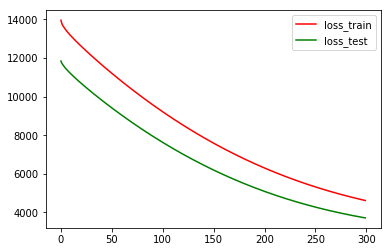

Test MSE: 3713.782                                                                                                     
Test MAE: 50.294                                                                                                       
Test R2: -0.296                                                                                                        
Test RMSE: 60.941                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6760.5988 - val_loss: 6045.2279                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6707.2748 - val_loss: 5998.7806                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6654.4747 - val_loss: 5952.8351                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6602.1953 - val_loss: 5907.3904                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6550.4358 - val_loss: 

 - 1s - loss: 4228.3723 - val_loss: 3920.6098                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4204.5456 - val_loss: 3901.9387                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4181.0638 - val_loss: 3883.5841                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4157.9234 - val_loss: 3865.5385                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4135.1170 - val_loss: 

 - 1s - loss: 3239.7211 - val_loss: 3209.4228                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3232.0251 - val_loss: 3204.8479                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3224.4738 - val_loss: 3200.3891                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3217.0652 - val_loss: 3196.0458                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3209.7969 - val_loss: 

 - 1s - loss: 2951.2270 - val_loss: 3075.9496                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2949.2443 - val_loss: 3075.5775                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2947.3030 - val_loss: 3075.2301                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2945.4027 - val_loss: 3074.9066                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2943.5419 - val_loss: 

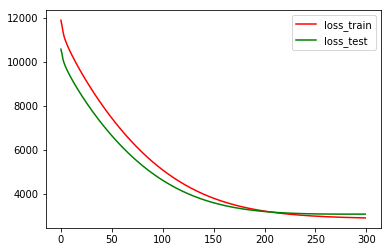

Test MSE: 3074.021                                                                                                     
Test MAE: 47.336                                                                                                       
Test R2: -0.000                                                                                                        
Test RMSE: 55.444                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6476.1740 - val_loss: 6972.8310                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6446.3322 - val_loss: 6940.1835                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6416.6396 - val_loss: 6907.6885                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6387.0948 - val_loss: 6875.3450                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6357.6971 - val_loss: 

 - 1s - loss: 4787.2517 - val_loss: 5104.9122                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4766.5812 - val_loss: 5081.7207                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4746.0357 - val_loss: 5058.6610                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4725.6167 - val_loss: 5035.7323                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4705.3233 - val_loss: 

 - 1s - loss: 3664.2116 - val_loss: 3824.9455                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3651.1775 - val_loss: 3809.7668                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3638.2441 - val_loss: 3794.6947                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3625.4102 - val_loss: 3779.7293                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3612.6763 - val_loss: 

 - 1s - loss: 2989.5746 - val_loss: 3020.8726                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2982.2000 - val_loss: 3011.7907                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2974.8941 - val_loss: 3002.7860                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2967.6563 - val_loss: 2993.8555                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2960.4862 - val_loss: 

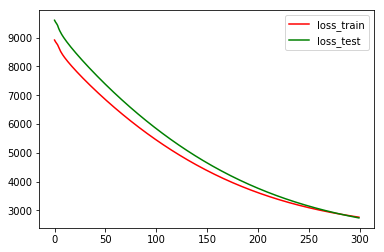

Test MSE: 2737.870                                                                                                     
Test MAE: 42.504                                                                                                       
Test R2: -0.398                                                                                                        
Test RMSE: 52.325                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 31, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 31, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5419.1219 - val_loss: 5731.5299                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5392.9573 - val_loss: 5703.5245                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5366.9366 - val_loss: 5675.6664                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5341.0595 - val_loss: 5647.9542                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5315.3252 - val_loss: 

 - 1s - loss: 3965.6317 - val_loss: 4161.4806                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3948.2787 - val_loss: 4142.5028                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3931.0445 - val_loss: 4123.6481                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3913.9298 - val_loss: 4104.9158                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3896.9329 - val_loss: 

 - 1s - loss: 3046.7839 - val_loss: 3142.7375                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3036.4765 - val_loss: 3131.0866                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3026.2589 - val_loss: 3119.5309                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3016.1312 - val_loss: 3108.0677                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3006.0902 - val_loss: 

 - 1s - loss: 2529.5762 - val_loss: 2545.7970                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2524.1455 - val_loss: 2539.3359                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2518.7710 - val_loss: 2532.9359                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2513.4521 - val_loss: 2526.5960                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2508.1889 - val_loss: 

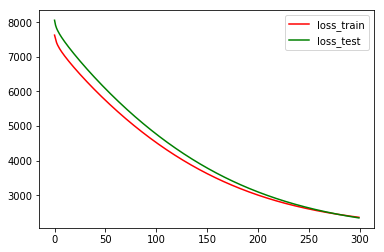

Test MSE: 2348.310                                                                                                     
Test MAE: 40.715                                                                                                       
Test R2: -0.253                                                                                                        
Test RMSE: 48.459                                                                                                      
Accuracy: 0.262                                                                                                        
(98, 30, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 30, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 2935.0865 - val_loss: 2821.6163                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 2904.3980 - val_loss: 2792.2044                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 2874.4669 - val_loss: 2763.5352                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 2845.2818 - val_loss: 2735.5970                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 2816.8296 - val_loss: 

 - 1s - loss: 2014.0247 - val_loss: 1954.9802                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2010.4302 - val_loss: 1951.7951                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2006.9676 - val_loss: 1948.7336                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2003.6329 - val_loss: 1945.7918                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2000.4218 - val_loss: 

 - 1s - loss: 1926.1453 - val_loss: 1881.8940                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 1925.8849 - val_loss: 1881.7322                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 1925.6347 - val_loss: 1881.5787                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 1925.3944 - val_loss: 1881.4331                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 1925.1635 - val_loss: 

 - 1s - loss: 1919.9611 - val_loss: 1879.3109                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 1919.9433 - val_loss: 1879.3176                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 1919.9262 - val_loss: 1879.3246                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 1919.9095 - val_loss: 1879.3317                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 1919.8936 - val_loss: 

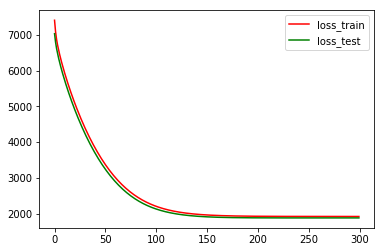

Test MSE: 1879.597                                                                                                     
Test MAE: 39.260                                                                                                       
Test R2: -0.000                                                                                                        
Test RMSE: 43.354                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5729.5398 - val_loss: 8155.5433                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5678.4388 - val_loss: 8089.5302                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5627.9908 - val_loss: 8024.2337                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5578.1916 - val_loss: 7959.6469                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5529.0371 - val_loss: 

 - 1s - loss: 3537.8505 - val_loss: 5121.1176                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3520.4894 - val_loss: 5093.8355                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3503.4658 - val_loss: 5066.9709                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3486.7745 - val_loss: 5040.5234                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3470.4121 - val_loss: 

 - 1s - loss: 2911.6314 - val_loss: 4001.4385                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2907.7447 - val_loss: 3992.5370                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2903.9518 - val_loss: 3983.7891                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2900.2502 - val_loss: 3975.1891                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2896.6384 - val_loss: 

 - 1s - loss: 2783.6680 - val_loss: 3642.1156                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2782.9558 - val_loss: 3639.2112                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2782.2614 - val_loss: 3636.3513                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2781.5850 - val_loss: 3633.5370                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2780.9260 - val_loss: 

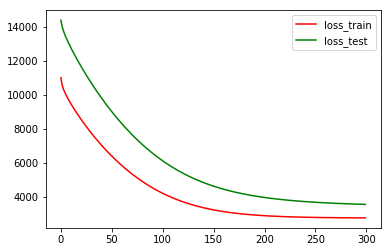

Test MSE: 3561.609                                                                                                     
Test MAE: 52.673                                                                                                       
Test R2: -0.119                                                                                                        
Test RMSE: 59.679                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4045.9291 - val_loss: 4081.7122                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4008.9416 - val_loss: 4036.8781                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3972.6394 - val_loss: 3992.7816                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3937.0139 - val_loss: 3949.4152                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3902.0575 - val_loss: 

 - 1s - loss: 2716.1372 - val_loss: 2351.0978                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2708.4446 - val_loss: 2339.3317                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2700.9619 - val_loss: 2327.8275                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2693.6848 - val_loss: 2316.5807                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2686.6086 - val_loss: 

 - 1s - loss: 2485.8150 - val_loss: 1941.2428                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2484.7732 - val_loss: 1938.6347                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2483.7635 - val_loss: 1936.0821                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2482.7849 - val_loss: 1933.5840                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2481.8359 - val_loss: 

 - 1s - loss: 2456.1796 - val_loss: 1845.7306                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2456.0529 - val_loss: 1845.0519                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2455.9304 - val_loss: 1844.3857                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2455.8115 - val_loss: 1843.7308                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2455.6963 - val_loss: 

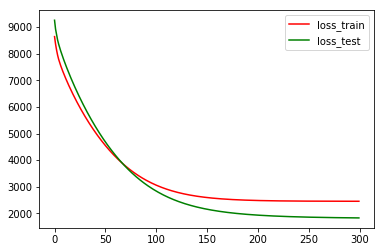

Test MSE: 1827.675                                                                                                     
Test MAE: 35.196                                                                                                       
Test R2: -0.057                                                                                                        
Test RMSE: 42.751                                                                                                      
Accuracy: 0.357                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4451.1152 - val_loss: 3801.4185                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4407.5509 - val_loss: 3755.0094                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4364.7325 - val_loss: 3709.3624                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4322.6529 - val_loss: 3664.4703                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4281.3053 - val_loss: 

 - 1s - loss: 2827.0727 - val_loss: 2026.6360                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2817.1259 - val_loss: 2015.0812                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2807.4409 - val_loss: 2003.8053                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2798.0111 - val_loss: 1992.8029                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2788.8317 - val_loss: 

 - 1s - loss: 2523.3168 - val_loss: 1649.8502                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2521.9050 - val_loss: 1647.7808                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2520.5359 - val_loss: 1645.7637                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2519.2079 - val_loss: 1643.7975                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2517.9202 - val_loss: 

 - 1s - loss: 2482.8281 - val_loss: 1581.3969                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2482.6524 - val_loss: 1580.9843                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2482.4826 - val_loss: 1580.5803                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2482.3178 - val_loss: 1580.1851                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2482.1577 - val_loss: 

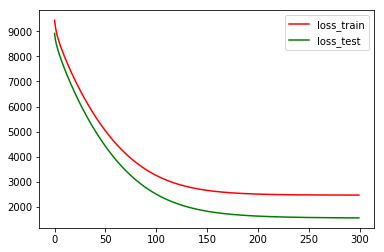

Test MSE: 1570.953                                                                                                     
Test MAE: 33.724                                                                                                       
Test R2: -0.014                                                                                                        
Test RMSE: 39.635                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 38, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 38, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5368.2495 - val_loss: 7268.5866                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5315.3569 - val_loss: 7204.7630                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5263.2690 - val_loss: 7141.7971                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5211.9795 - val_loss: 7079.6876                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5161.4828 - val_loss: 

 - 1s - loss: 3279.9215 - val_loss: 4587.1397                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3265.7425 - val_loss: 4566.4207                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3251.9015 - val_loss: 4546.1065                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3238.3920 - val_loss: 4526.1947                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3225.2072 - val_loss: 

 - 1s - loss: 2822.3397 - val_loss: 3825.4318                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2820.0038 - val_loss: 3820.2727                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2817.7347 - val_loss: 3815.2193                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2815.5304 - val_loss: 3810.2706                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2813.3888 - val_loss: 

 - 1s - loss: 2752.7506 - val_loss: 3633.3757                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2752.4270 - val_loss: 3631.9823                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2752.1128 - val_loss: 3630.6144                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2751.8078 - val_loss: 3629.2702                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2751.5119 - val_loss: 

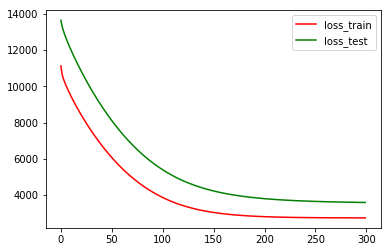

Test MSE: 3596.095                                                                                                     
Test MAE: 51.878                                                                                                       
Test R2: -0.048                                                                                                        
Test RMSE: 59.967                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 34, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 34, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4612.7417 - val_loss: 4585.8738                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4569.6882 - val_loss: 4540.2475                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4527.3659 - val_loss: 4495.3669                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4485.7684 - val_loss: 4451.2266                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4444.8891 - val_loss: 

 - 1s - loss: 2996.8793 - val_loss: 2833.2725                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2986.7868 - val_loss: 2821.7078                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2976.9521 - val_loss: 2810.4173                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2967.3702 - val_loss: 2799.3959                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2958.0361 - val_loss: 

 - 1s - loss: 2682.9538 - val_loss: 2451.7334                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2681.4361 - val_loss: 2449.5953                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2679.9624 - val_loss: 2447.5101                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2678.5320 - val_loss: 2445.4764                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2677.1434 - val_loss: 

 - 1s - loss: 2638.4977 - val_loss: 2380.5320                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2638.2963 - val_loss: 2380.0990                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2638.1012 - val_loss: 2379.6755                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2637.9119 - val_loss: 2379.2616                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2637.7282 - val_loss: 

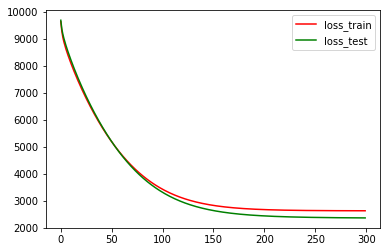

Test MSE: 2369.577                                                                                                     
Test MAE: 43.968                                                                                                       
Test R2: -0.009                                                                                                        
Test RMSE: 48.678                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 32, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 32, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3922.9826 - val_loss: 3182.6239                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3884.7107 - val_loss: 3147.6489                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3847.1477 - val_loss: 3113.3583                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3810.2851 - val_loss: 3079.7436                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3774.1146 - val_loss: 

 - 1s - loss: 2552.8265 - val_loss: 1977.0353                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2545.0440 - val_loss: 1970.8553                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2537.4796 - val_loss: 1964.8710                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2530.1284 - val_loss: 1959.0781                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2522.9853 - val_loss: 

 - 1s - loss: 2324.2548 - val_loss: 1816.4709                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2323.2652 - val_loss: 1816.0451                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2322.3067 - val_loss: 1815.6414                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2321.3781 - val_loss: 1815.2589                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2320.4790 - val_loss: 

 - 1s - loss: 2296.7226 - val_loss: 1812.0301                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2296.6102 - val_loss: 1812.1050                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2296.5018 - val_loss: 1812.1805                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2296.3965 - val_loss: 1812.2564                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2296.2947 - val_loss: 

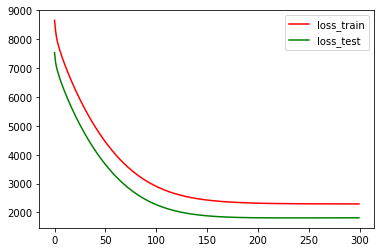

Test MSE: 1814.738                                                                                                     
Test MAE: 37.021                                                                                                       
Test R2: -0.002                                                                                                        
Test RMSE: 42.600                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 7052.0924 - val_loss: 6445.0122                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6998.5404 - val_loss: 6398.5169                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6945.5078 - val_loss: 6352.5195                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6892.9914 - val_loss: 6307.0170                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6840.9901 - val_loss: 

 - 1s - loss: 4494.9138 - val_loss: 4306.5246                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4470.5959 - val_loss: 4287.5186                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4446.6206 - val_loss: 4268.8240                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4422.9850 - val_loss: 4250.4375                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4399.6830 - val_loss: 

 - 1s - loss: 3472.9982 - val_loss: 3572.1404                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3464.8616 - val_loss: 3567.2697                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3456.8731 - val_loss: 3562.5188                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3449.0309 - val_loss: 3557.8854                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3441.3307 - val_loss: 

 - 1s - loss: 3162.4636 - val_loss: 3425.5547                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3160.2661 - val_loss: 3425.0842                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3158.1123 - val_loss: 3424.6407                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 3156.0018 - val_loss: 3424.2235                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3153.9341 - val_loss: 

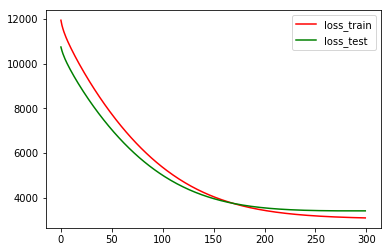

Test MSE: 3421.376                                                                                                     
Test MAE: 49.996                                                                                                       
Test R2: -0.000                                                                                                        
Test RMSE: 58.493                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5941.8246 - val_loss: 7233.5240                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5900.9944 - val_loss: 7183.6943                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5860.5267 - val_loss: 7134.2517                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5820.4198 - val_loss: 7085.1946                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5780.6722 - val_loss: 

 - 1s - loss: 3932.2148 - val_loss: 4682.2764                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3912.1157 - val_loss: 4655.1486                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3892.2686 - val_loss: 4628.3045                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3872.6687 - val_loss: 4601.7433                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3853.3140 - val_loss: 

 - 1s - loss: 3043.3901 - val_loss: 3399.9862                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3035.7069 - val_loss: 3387.6228                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3028.1452 - val_loss: 3375.4138                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3020.7051 - val_loss: 3363.3612                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3013.3846 - val_loss: 

 - 1s - loss: 2731.9194 - val_loss: 2843.3697                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2729.4979 - val_loss: 2838.2242                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2727.1195 - val_loss: 2833.1456                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2724.7839 - val_loss: 2828.1342                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2722.4908 - val_loss: 

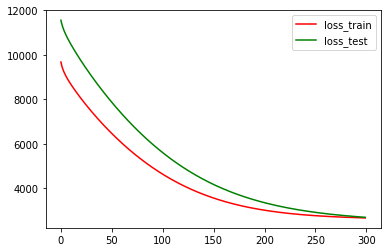

Test MSE: 2694.656                                                                                                     
Test MAE: 43.844                                                                                                       
Test R2: -0.198                                                                                                        
Test RMSE: 51.910                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6270.6989 - val_loss: 5001.9650                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6231.3924 - val_loss: 4971.8670                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6192.3440 - val_loss: 4942.0105                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6153.5534 - val_loss: 4912.3949                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6115.0188 - val_loss: 

 - 1s - loss: 4173.8484 - val_loss: 3481.3361                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4150.2640 - val_loss: 3465.6394                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4126.8878 - val_loss: 3450.1274                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4103.7187 - val_loss: 3434.7991                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4080.7571 - val_loss: 

 - 1s - loss: 3009.3074 - val_loss: 2787.2349                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2997.5260 - val_loss: 2781.5113                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2985.8841 - val_loss: 2775.8970                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2974.3798 - val_loss: 2770.3907                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2963.0127 - val_loss: 

 - 1s - loss: 2475.1446 - val_loss: 2592.8980                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2470.2995 - val_loss: 2592.1364                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2465.5233 - val_loss: 2591.4170                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2460.8160 - val_loss: 2590.7393                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2456.1768 - val_loss: 

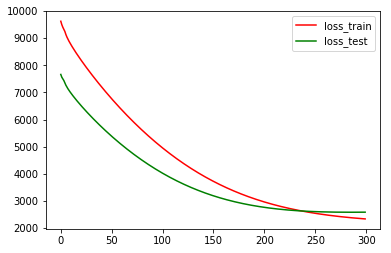

Test MSE: 2587.142                                                                                                     
Test MAE: 46.085                                                                                                       
Test R2: -0.001                                                                                                        
Test RMSE: 50.864                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 30, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 30, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 2649.7851 - val_loss: 2628.3959                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 2619.0383 - val_loss: 2607.5436                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 2589.1731 - val_loss: 2587.4581                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 2560.1736 - val_loss: 2568.1225                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 2532.0240 - val_loss: 

 - 1s - loss: 1824.2572 - val_loss: 2218.8887                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 1821.8439 - val_loss: 2219.5005                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 1819.5353 - val_loss: 2220.1510                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 1817.3268 - val_loss: 2220.8372                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 1815.2144 - val_loss: 

 - 1s - loss: 1772.3102 - val_loss: 2272.2334                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 1772.1977 - val_loss: 2272.7692                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 1772.0903 - val_loss: 2273.2953                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 1771.9877 - val_loss: 2273.8115                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 1771.8898 - val_loss: 

 - 1s - loss: 1769.9279 - val_loss: 2292.0634                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 1769.9227 - val_loss: 2292.1937                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 1769.9177 - val_loss: 2292.3211                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 1769.9129 - val_loss: 2292.4455                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 1769.9086 - val_loss: 

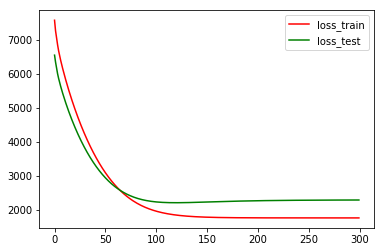

Test MSE: 2295.308                                                                                                     
Test MAE: 43.064                                                                                                       
Test R2: -0.036                                                                                                        
Test RMSE: 47.909                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 31, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 31, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3074.4875 - val_loss: 3407.1921                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3042.8687 - val_loss: 3370.4759                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3012.0123 - val_loss: 3334.5669                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 2981.9076 - val_loss: 3299.4562                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 2952.5421 - val_loss: 

 - 1s - loss: 2110.6642 - val_loss: 2204.9856                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2106.7617 - val_loss: 2198.9933                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2103.0000 - val_loss: 2193.1764                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2099.3736 - val_loss: 2187.5302                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2095.8781 - val_loss: 

 - 1s - loss: 2013.6720 - val_loss: 2026.0573                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2013.3747 - val_loss: 2025.1564                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2013.0891 - val_loss: 2024.2788                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2012.8143 - val_loss: 2023.4237                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2012.5502 - val_loss: 

 - 1s - loss: 2006.5525 - val_loss: 1996.1374                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2006.5317 - val_loss: 1995.9537                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2006.5119 - val_loss: 1995.7742                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2006.4929 - val_loss: 1995.5987                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2006.4743 - val_loss: 

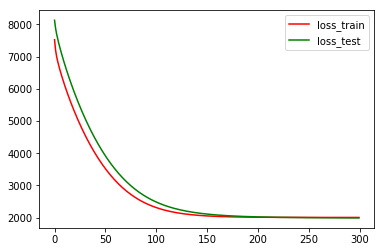

Test MSE: 1991.492                                                                                                     
Test MAE: 39.194                                                                                                       
Test R2: -0.018                                                                                                        
Test RMSE: 44.626                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4316.3242 - val_loss: 5121.0046                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4274.9903 - val_loss: 5073.8100                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4234.2730 - val_loss: 5027.2613                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4194.1676 - val_loss: 4981.3537                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4154.6695 - val_loss: 

 - 1s - loss: 2665.7108 - val_loss: 3150.4883                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2654.2289 - val_loss: 3135.4388                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2643.0112 - val_loss: 3120.6881                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2632.0542 - val_loss: 3106.2341                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2621.3522 - val_loss: 

 - 1s - loss: 2287.9173 - val_loss: 2604.4937                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2285.9155 - val_loss: 2600.8997                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2283.9693 - val_loss: 2597.3828                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2282.0766 - val_loss: 2593.9406                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2280.2361 - val_loss: 

 - 1s - loss: 2227.0755 - val_loss: 2473.6459                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2226.7812 - val_loss: 2472.7287                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2226.4955 - val_loss: 2471.8289                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2226.2179 - val_loss: 2470.9461                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2225.9484 - val_loss: 

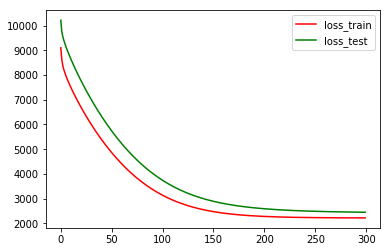

Test MSE: 2449.370                                                                                                     
Test MAE: 43.538                                                                                                       
Test R2: -0.032                                                                                                        
Test RMSE: 49.491                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 35, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 35, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6158.3915 - val_loss: 6134.9708                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6112.7494 - val_loss: 6092.6083                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6067.4914 - val_loss: 6050.6220                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6022.6167 - val_loss: 6009.0099                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5978.1228 - val_loss: 

 - 1s - loss: 3880.1514 - val_loss: 4055.9085                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3856.9701 - val_loss: 4035.3379                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3834.0678 - val_loss: 4015.0354                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3811.4435 - val_loss: 3994.9976                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3789.0938 - val_loss: 

 - 1s - loss: 2847.9850 - val_loss: 3170.2979                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2839.0444 - val_loss: 3163.0959                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2830.2469 - val_loss: 3156.0239                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2821.5911 - val_loss: 3149.0825                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2813.0772 - val_loss: 

 - 1s - loss: 2489.1143 - val_loss: 2901.4775                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2486.3869 - val_loss: 2899.7317                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2483.7100 - val_loss: 2898.0279                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2481.0838 - val_loss: 2896.3650                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2478.5064 - val_loss: 

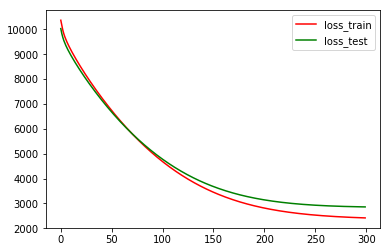

Test MSE: 2859.862                                                                                                     
Test MAE: 46.833                                                                                                       
Test R2: -0.006                                                                                                        
Test RMSE: 53.478                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5133.4100 - val_loss: 5717.1884                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5084.0413 - val_loss: 5661.9722                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5035.4527 - val_loss: 5607.5657                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4987.6356 - val_loss: 5553.9631                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4940.5843 - val_loss: 

 - 1s - loss: 3214.4914 - val_loss: 3483.4403                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3201.7774 - val_loss: 3467.2861                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3189.3723 - val_loss: 3451.4743                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3177.2688 - val_loss: 3436.0023                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3165.4633 - val_loss: 

 - 1s - loss: 2808.0166 - val_loss: 2917.4910                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2805.9649 - val_loss: 2913.9626                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2803.9724 - val_loss: 2910.5134                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2802.0367 - val_loss: 2907.1401                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2800.1564 - val_loss: 

 - 1s - loss: 2747.0024 - val_loss: 2792.3774                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2746.7187 - val_loss: 2791.5335                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2746.4435 - val_loss: 2790.7067                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2746.1765 - val_loss: 2789.8961                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2745.9173 - val_loss: 

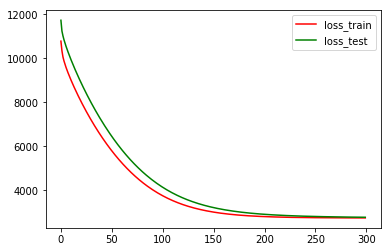

Test MSE: 2770.294                                                                                                     
Test MAE: 46.727                                                                                                       
Test R2: -0.023                                                                                                        
Test RMSE: 52.634                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5113.7006 - val_loss: 4999.5680                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5060.1802 - val_loss: 4944.9944                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5007.7400 - val_loss: 4891.5078                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4956.3678 - val_loss: 4839.0947                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4906.0509 - val_loss: 

 - 1s - loss: 3298.3708 - val_loss: 3127.6314                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3289.2131 - val_loss: 3117.8639                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3280.3411 - val_loss: 3108.3902                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3271.7469 - val_loss: 3099.2003                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3263.4223 - val_loss: 

 - 1s - loss: 3047.6551 - val_loss: 2849.8419                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3046.7148 - val_loss: 2848.6693                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3045.8071 - val_loss: 2847.5331                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3044.9308 - val_loss: 2846.4318                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3044.0851 - val_loss: 

 - 1s - loss: 3023.1761 - val_loss: 2815.9271                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3023.0894 - val_loss: 2815.7655                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3023.0057 - val_loss: 2815.6087                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 3022.9250 - val_loss: 2815.4560                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3022.8474 - val_loss: 

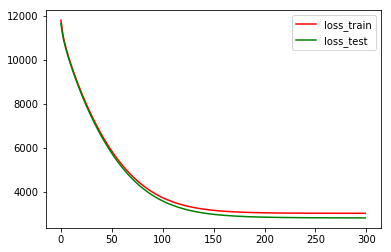

Test MSE: 2812.137                                                                                                     
Test MAE: 44.367                                                                                                       
Test R2: -0.002                                                                                                        
Test RMSE: 53.030                                                                                                      
Accuracy: 0.333                                                                                                        
(98, 34, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 34, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5296.3178 - val_loss: 5423.1856                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5253.7041 - val_loss: 5379.5553                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5211.5775 - val_loss: 5336.4165                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5169.9355 - val_loss: 5293.7646                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5128.7754 - val_loss: 

 - 1s - loss: 3379.0085 - val_loss: 3446.3178                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3362.4404 - val_loss: 3429.0062                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3346.1516 - val_loss: 3411.9789                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3330.1376 - val_loss: 3395.2311                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3314.3959 - val_loss: 

 - 1s - loss: 2735.1328 - val_loss: 2762.7591                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2730.5883 - val_loss: 2757.7708                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2726.1390 - val_loss: 2752.8826                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2721.7827 - val_loss: 2748.0913                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2717.5190 - val_loss: 

 - 1s - loss: 2573.4736 - val_loss: 2579.1975                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2572.4460 - val_loss: 2577.9442                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2571.4417 - val_loss: 2576.7165                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2570.4601 - val_loss: 2575.5141                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2569.5010 - val_loss: 

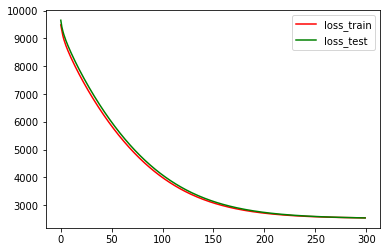

Test MSE: 2546.958                                                                                                     
Test MAE: 44.810                                                                                                       
Test R2: -0.014                                                                                                        
Test RMSE: 50.467                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 7676.8894 - val_loss: 6753.8922                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 7653.3607 - val_loss: 6731.9218                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 7629.9026 - val_loss: 6710.0201                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 7606.5142 - val_loss: 6688.1873                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 7583.1962 - val_loss: 

 - 1s - loss: 6249.7772 - val_loss: 5428.4167                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 6230.7076 - val_loss: 5410.8203                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 6211.7016 - val_loss: 5393.2865                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 6192.7595 - val_loss: 5375.8154                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 6173.8817 - val_loss: 

 - 1s - loss: 5110.0030 - val_loss: 4384.1370                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 5095.0523 - val_loss: 4370.5573                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 5080.1597 - val_loss: 4357.0357                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 5065.3261 - val_loss: 4343.5695                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 5050.5507 - val_loss: 

 - 1s - loss: 4233.2559 - val_loss: 3595.2932                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 4222.0107 - val_loss: 3585.2960                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 4210.8182 - val_loss: 3575.3473                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 4199.6768 - val_loss: 3565.4485                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 4188.5868 - val_loss: 

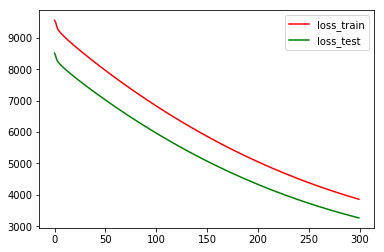

Test MSE: 3265.657                                                                                                     
Test MAE: 47.409                                                                                                       
Test R2: -0.561                                                                                                        
Test RMSE: 57.146                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 30, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 30, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4844.0203 - val_loss: 4621.1634                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4812.6774 - val_loss: 4589.8627                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4781.5780 - val_loss: 4558.8058                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4750.7215 - val_loss: 4527.9906                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4720.1061 - val_loss: 

 - 1s - loss: 3239.1035 - val_loss: 3018.5072                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3222.0663 - val_loss: 3001.4948                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3205.2096 - val_loss: 2984.6628                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3188.5317 - val_loss: 2968.0088                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3172.0328 - val_loss: 

 - 1s - loss: 2442.3851 - val_loss: 2222.8039                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2434.9113 - val_loss: 2215.3355                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2427.5409 - val_loss: 2207.9695                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2420.2718 - val_loss: 2200.7054                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2413.1043 - val_loss: 

 - 1s - loss: 2121.3581 - val_loss: 1901.6334                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2118.6480 - val_loss: 1898.9160                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2115.9816 - val_loss: 1896.2417                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2113.3581 - val_loss: 1893.6107                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2110.7768 - val_loss: 

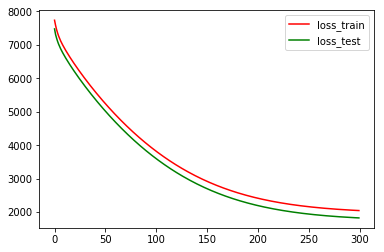

Test MSE: 1827.026                                                                                                     
Test MAE: 37.534                                                                                                       
Test R2: -0.051                                                                                                        
Test RMSE: 42.744                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 32, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 32, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3235.8667 - val_loss: 3710.1902                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3197.4956 - val_loss: 3669.3748                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3159.9904 - val_loss: 3629.4423                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3123.3381 - val_loss: 3590.3805                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3087.5279 - val_loss: 

 - 1s - loss: 2029.9479 - val_loss: 2384.4493                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2024.9088 - val_loss: 2378.3001                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2020.0518 - val_loss: 2372.3503                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2015.3707 - val_loss: 2366.5942                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2010.8594 - val_loss: 

 - 1s - loss: 1905.9921 - val_loss: 2216.4244                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 1905.6272 - val_loss: 2215.7339                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 1905.2769 - val_loss: 2215.0642                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 1904.9402 - val_loss: 2214.4148                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 1904.6174 - val_loss: 

 - 1s - loss: 1897.4431 - val_loss: 2195.6901                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 1897.4197 - val_loss: 2195.5812                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 1897.3971 - val_loss: 2195.4748                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 1897.3755 - val_loss: 2195.3709                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 1897.3548 - val_loss: 

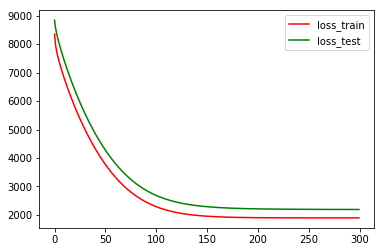

Test MSE: 2193.032                                                                                                     
Test MAE: 41.190                                                                                                       
Test R2: -0.004                                                                                                        
Test RMSE: 46.830                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 35, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 35, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5017.6802 - val_loss: 4346.5010                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4963.1387 - val_loss: 4308.0229                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4909.4333 - val_loss: 4270.2998                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4856.5586 - val_loss: 4233.3257                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4804.5087 - val_loss: 

 - 1s - loss: 2885.6821 - val_loss: 3080.9445                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2871.6759 - val_loss: 3076.3145                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2858.0205 - val_loss: 3071.9297                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2844.7106 - val_loss: 3067.7832                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2831.7373 - val_loss: 

 - 1s - loss: 2450.4415 - val_loss: 3068.0214                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2448.3985 - val_loss: 3069.7079                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2446.4182 - val_loss: 3071.4006                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2444.4975 - val_loss: 3073.0968                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2442.6361 - val_loss: 

 - 1s - loss: 2392.3984 - val_loss: 3166.0303                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2392.1530 - val_loss: 3167.0811                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2391.9155 - val_loss: 3168.1187                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2391.6853 - val_loss: 3169.1440                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2391.4625 - val_loss: 

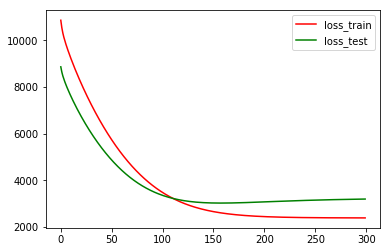

Test MSE: 3196.433                                                                                                     
Test MAE: 50.482                                                                                                       
Test R2: -0.057                                                                                                        
Test RMSE: 56.537                                                                                                      
Accuracy: 0.143                                                                                                        
(98, 31, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 31, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3882.0188 - val_loss: 3509.9704                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3840.9357 - val_loss: 3474.4504                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3800.4856 - val_loss: 3439.5344                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3760.6634 - val_loss: 3405.2168                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3721.4641 - val_loss: 

 - 1s - loss: 2275.8151 - val_loss: 2202.1890                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2265.2100 - val_loss: 2194.7935                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2254.8687 - val_loss: 2187.6260                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2244.7868 - val_loss: 2180.6790                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2234.9563 - val_loss: 

 - 1s - loss: 1943.3936 - val_loss: 2014.1316                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 1941.8000 - val_loss: 2013.8142                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 1940.2536 - val_loss: 2013.5253                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 1938.7536 - val_loss: 2013.2637                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 1937.2985 - val_loss: 

 - 1s - loss: 1897.5066 - val_loss: 2021.8903                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 1897.3070 - val_loss: 2022.1399                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 1897.1137 - val_loss: 2022.3886                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 1896.9263 - val_loss: 2022.6363                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 1896.7448 - val_loss: 

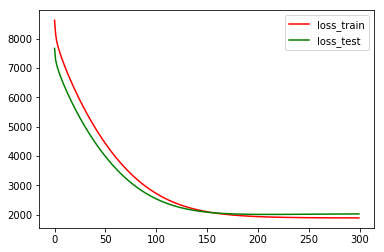

Test MSE: 2029.940                                                                                                     
Test MAE: 39.477                                                                                                       
Test R2: -0.009                                                                                                        
Test RMSE: 45.055                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6549.2076 - val_loss: 9477.9455                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6506.2578 - val_loss: 9420.2802                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6463.6722 - val_loss: 9363.0184                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6421.4495 - val_loss: 9306.1582                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6379.5876 - val_loss: 

 - 1s - loss: 4404.0201 - val_loss: 6442.2749                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4382.0607 - val_loss: 6408.6605                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4360.3578 - val_loss: 6375.3549                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 4338.9101 - val_loss: 6342.3583                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4317.7152 - val_loss: 

 - 1s - loss: 3409.7362 - val_loss: 4788.0921                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3400.8207 - val_loss: 4771.2023                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3392.0385 - val_loss: 4754.5001                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 3383.3888 - val_loss: 4737.9841                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3374.8689 - val_loss: 

 - 1s - loss: 3038.1434 - val_loss: 3992.3932                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3035.1315 - val_loss: 3984.5793                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3032.1700 - val_loss: 3976.8537                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 3029.2585 - val_loss: 3969.2174                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3026.3962 - val_loss: 

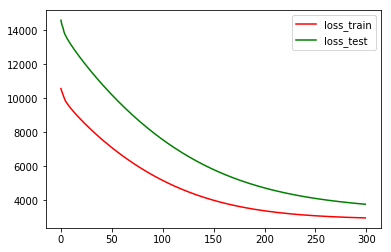

Test MSE: 3761.050                                                                                                     
Test MAE: 50.903                                                                                                       
Test R2: -0.328                                                                                                        
Test RMSE: 61.327                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 10257.8285 - val_loss: 9482.9242                                                                         

Epoch 64/300                                                                                                           
 - 1s - loss: 10229.8444 - val_loss: 9456.6722                                                                         

Epoch 65/300                                                                                                           
 - 1s - loss: 10201.9329 - val_loss: 9430.4905                                                                         

Epoch 66/300                                                                                                           
 - 1s - loss: 10174.0934 - val_loss: 9404.3808                                                                         

Epoch 67/300                                                                                                           
 - 1s - loss: 10146.3262 - val_loss:

 - 1s - loss: 8536.0026 - val_loss: 7874.5004                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 8512.5917 - val_loss: 7852.7435                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 8489.2478 - val_loss: 7831.0521                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 8465.9696 - val_loss: 7809.4234                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 8442.7555 - val_loss: 

 - 1s - loss: 7110.4888 - val_loss: 6556.8922                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 7091.3640 - val_loss: 6539.3316                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 7072.3020 - val_loss: 6521.8317                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 7053.3024 - val_loss: 6504.3936                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 7034.3654 - val_loss: 

 - 1s - loss: 5962.3208 - val_loss: 5509.9784                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 5947.1690 - val_loss: 5496.2811                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 5932.0743 - val_loss: 5482.6377                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 5917.0347 - val_loss: 5469.0489                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 5902.0526 - val_loss: 

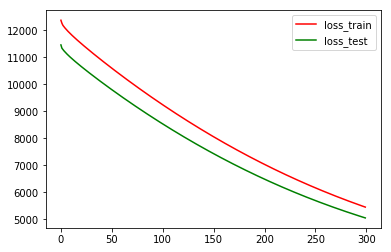

Test MSE: 5050.572                                                                                                     
Test MAE: 53.620                                                                                                       
Test R2: -0.667                                                                                                        
Test RMSE: 71.067                                                                                                      
Accuracy: 0.333                                                                                                        
(98, 38, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 38, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 8642.2913 - val_loss: 10334.9708                                                                         

Epoch 64/300                                                                                                           
 - 1s - loss: 8607.5023 - val_loss: 10294.9609                                                                         

Epoch 65/300                                                                                                           
 - 1s - loss: 8572.8636 - val_loss: 10255.1069                                                                         

Epoch 66/300                                                                                                           
 - 1s - loss: 8538.3746 - val_loss: 10215.4080                                                                         

Epoch 67/300                                                                                                           
 - 1s - loss: 8504.0346 - val_loss: 

 - 1s - loss: 6627.0289 - val_loss: 7984.2454                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 6601.5962 - val_loss: 7954.0450                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 6576.2951 - val_loss: 7923.9830                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 6551.1243 - val_loss: 7894.0578                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 6526.0821 - val_loss: 

 - 1s - loss: 5197.8489 - val_loss: 6253.8727                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 5180.4986 - val_loss: 6232.3313                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 5163.2580 - val_loss: 6210.9079                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 5146.1263 - val_loss: 6189.6041                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 5129.1025 - val_loss: 

 - 1s - loss: 4258.0349 - val_loss: 5055.4370                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 4247.1248 - val_loss: 5041.0242                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 4236.2968 - val_loss: 5026.7029                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 4225.5512 - val_loss: 5012.4748                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 4214.8865 - val_loss: 

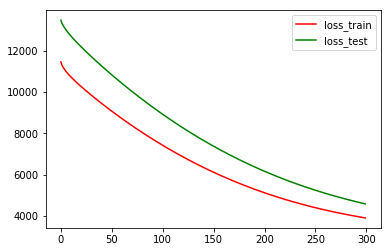

Test MSE: 4592.109                                                                                                     
Test MAE: 56.822                                                                                                       
Test R2: -0.583                                                                                                        
Test RMSE: 67.765                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3943.4329 - val_loss: 4516.3693                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3900.0221 - val_loss: 4476.3866                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3857.3824 - val_loss: 4437.1539                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3815.5063 - val_loss: 4398.6611                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3774.3860 - val_loss: 

 - 1s - loss: 2368.8587 - val_loss: 3116.2032                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2359.8854 - val_loss: 3108.9518                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2351.1695 - val_loss: 3101.9329                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2342.7036 - val_loss: 3095.1411                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2334.4831 - val_loss: 

 - 1s - loss: 2110.6386 - val_loss: 2930.2788                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2109.5820 - val_loss: 2929.8071                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2108.5600 - val_loss: 2929.3606                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2107.5721 - val_loss: 2928.9381                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2106.6168 - val_loss: 

 - 1s - loss: 2082.2426 - val_loss: 2925.3105                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2082.1348 - val_loss: 2925.3867                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2082.0310 - val_loss: 2925.4632                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2081.9307 - val_loss: 2925.5403                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2081.8336 - val_loss: 

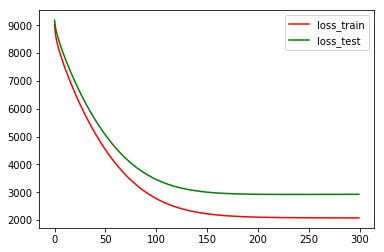

Test MSE: 2928.012                                                                                                     
Test MAE: 47.913                                                                                                       
Test R2: -0.001                                                                                                        
Test RMSE: 54.111                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6104.6369 - val_loss: 5911.2002                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6055.2786 - val_loss: 5863.2905                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6006.4341 - val_loss: 5815.8899                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5958.1015 - val_loss: 5768.9952                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5910.2772 - val_loss: 

 - 1s - loss: 3808.0207 - val_loss: 3698.8804                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3787.1103 - val_loss: 3679.0052                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3766.5221 - val_loss: 3659.4494                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3746.2545 - val_loss: 3640.2044                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3726.3005 - val_loss: 

 - 1s - loss: 2964.6406 - val_loss: 2909.3774                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2958.3594 - val_loss: 2903.6738                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2952.2022 - val_loss: 2898.0888                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2946.1686 - val_loss: 2892.6219                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2940.2558 - val_loss: 

 - 1s - loss: 2735.3688 - val_loss: 2707.7939                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2733.8569 - val_loss: 2706.5578                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2732.3778 - val_loss: 2705.3511                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2730.9309 - val_loss: 2704.1738                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2729.5157 - val_loss: 

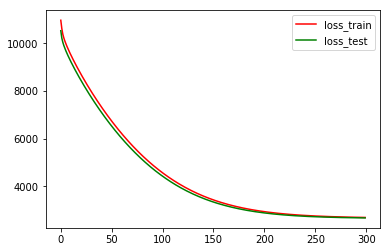

Test MSE: 2678.074                                                                                                     
Test MAE: 43.667                                                                                                       
Test R2: -0.006                                                                                                        
Test RMSE: 51.750                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 8820.4244 - val_loss: 9967.2963                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 8782.0993 - val_loss: 9927.2201                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 8743.9308 - val_loss: 9887.3014                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 8705.9187 - val_loss: 9847.5417                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 8668.0631 - val_loss: 

 - 2s - loss: 6584.5610 - val_loss: 7618.0245                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 6556.1142 - val_loss: 7587.9529                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 6527.8081 - val_loss: 7558.0249                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 6499.6407 - val_loss: 7528.2360                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 6471.6144 - val_loss: 

 - 1s - loss: 4975.7116 - val_loss: 5905.7710                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 4956.0504 - val_loss: 5884.6575                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 4936.5086 - val_loss: 5863.6692                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 4917.0894 - val_loss: 5842.8038                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 4897.7887 - val_loss: 

 - 2s - loss: 3907.5759 - val_loss: 4747.4755                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 3895.1615 - val_loss: 4733.8309                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 3882.8414 - val_loss: 4720.2851                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 3870.6151 - val_loss: 4706.8357                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 3858.4813 - val_loss: 

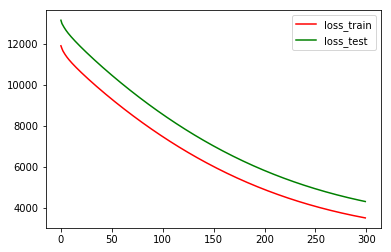

Test MSE: 4314.623                                                                                                     
Test MAE: 56.220                                                                                                       
Test R2: -0.385                                                                                                        
Test RMSE: 65.686                                                                                                      
Accuracy: 0.143                                                                                                        
(98, 32, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 32, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3055.0563 - val_loss: 3957.4064                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3021.2020 - val_loss: 3917.2878                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 2988.2554 - val_loss: 3878.1391                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 2956.2007 - val_loss: 3839.9451                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 2925.0215 - val_loss: 

 - 1s - loss: 2098.2353 - val_loss: 2720.5627                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2095.0305 - val_loss: 2715.0964                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2091.9550 - val_loss: 2709.8037                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2089.0043 - val_loss: 2704.6788                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2086.1728 - val_loss: 

 - 1s - loss: 2025.2785 - val_loss: 2564.2159                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2025.0971 - val_loss: 2563.4752                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2024.9234 - val_loss: 2562.7545                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2024.7572 - val_loss: 2562.0528                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2024.5980 - val_loss: 

 - 1s - loss: 2021.2717 - val_loss: 2540.2429                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2021.2622 - val_loss: 2540.1027                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2021.2531 - val_loss: 2539.9660                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2021.2445 - val_loss: 2539.8329                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2021.2361 - val_loss: 

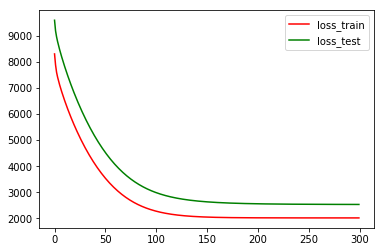

Test MSE: 2536.779                                                                                                     
Test MAE: 46.009                                                                                                       
Test R2: -0.017                                                                                                        
Test RMSE: 50.366                                                                                                      
Accuracy: 0.119                                                                                                        
(98, 34, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 34, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 6492.3921 - val_loss: 7350.2547                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 6453.7911 - val_loss: 7309.7826                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 6415.4430 - val_loss: 7269.5673                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 6377.3472 - val_loss: 7229.6071                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 6339.5033 - val_loss: 

 - 2s - loss: 4431.2598 - val_loss: 5172.0196                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4408.0183 - val_loss: 5147.1725                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 4384.9789 - val_loss: 5122.5341                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4362.1411 - val_loss: 5098.1017                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4339.5054 - val_loss: 

 - 1s - loss: 3276.9884 - val_loss: 3921.6832                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3265.1832 - val_loss: 3908.6317                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3253.5133 - val_loss: 3895.7217                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3241.9773 - val_loss: 3882.9492                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3230.5744 - val_loss: 

 - 1s - loss: 2734.2962 - val_loss: 3308.1581                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2729.2594 - val_loss: 3302.2543                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2724.2914 - val_loss: 3296.4244                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2719.3916 - val_loss: 3290.6683                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2714.5585 - val_loss: 

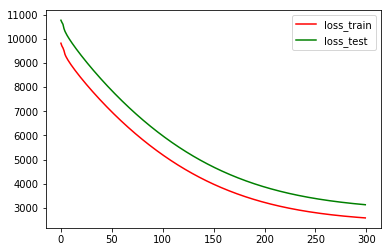

Test MSE: 3136.956                                                                                                     
Test MAE: 50.766                                                                                                       
Test R2: -0.106                                                                                                        
Test RMSE: 56.009                                                                                                      
Accuracy: 0.095                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5564.1697 - val_loss: 7279.4769                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5538.3413 - val_loss: 7247.4953                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5512.6551 - val_loss: 7215.6657                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5487.1108 - val_loss: 7183.9889                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5461.7079 - val_loss: 

 - 1s - loss: 4128.8125 - val_loss: 5455.5489                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4111.6522 - val_loss: 5432.9855                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4094.6102 - val_loss: 5410.5526                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 4077.6849 - val_loss: 5388.2478                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 4060.8743 - val_loss: 

 - 1s - loss: 3217.6949 - val_loss: 4212.5303                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3207.4266 - val_loss: 4197.8006                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3197.2446 - val_loss: 4183.1718                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3187.1492 - val_loss: 4168.6453                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3177.1401 - val_loss: 

 - 1s - loss: 2699.1410 - val_loss: 3429.2416                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2693.6425 - val_loss: 3420.3190                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2688.2000 - val_loss: 3411.4671                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2682.8130 - val_loss: 3402.6875                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2677.4812 - val_loss: 

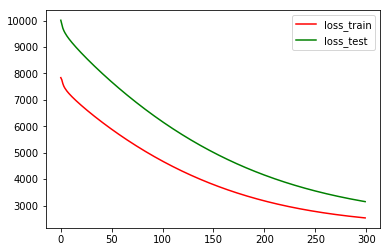

Test MSE: 3149.268                                                                                                     
Test MAE: 49.357                                                                                                       
Test R2: -0.481                                                                                                        
Test RMSE: 56.118                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 35, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 35, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4274.4074 - val_loss: 4291.8462                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4227.0699 - val_loss: 4242.6249                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4180.6536 - val_loss: 4194.3365                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4135.1493 - val_loss: 4146.9722                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 4090.5469 - val_loss: 

 - 1s - loss: 2642.5756 - val_loss: 2562.4187                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2634.1664 - val_loss: 2553.0125                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2626.0171 - val_loss: 2543.8797                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2618.1222 - val_loss: 2535.0142                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2610.4733 - val_loss: 

 - 1s - loss: 2412.1338 - val_loss: 2289.0791                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2411.2737 - val_loss: 2287.8629                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2410.4430 - val_loss: 2286.6832                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2409.6413 - val_loss: 2285.5383                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2408.8677 - val_loss: 

 - 1s - loss: 2389.7839 - val_loss: 2252.5143                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2389.7041 - val_loss: 2252.3252                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2389.6277 - val_loss: 2252.1406                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2389.5539 - val_loss: 2251.9607                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2389.4827 - val_loss: 

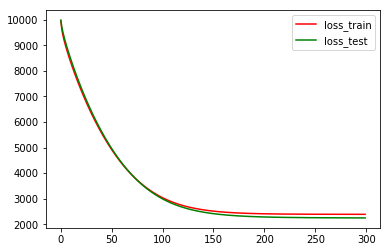

Test MSE: 2247.924                                                                                                     
Test MAE: 40.789                                                                                                       
Test R2: -0.004                                                                                                        
Test RMSE: 47.412                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 11197.2424 - val_loss: 10768.9455                                                                        

Epoch 64/300                                                                                                           
 - 2s - loss: 11167.9051 - val_loss: 10741.0537                                                                        

Epoch 65/300                                                                                                           
 - 2s - loss: 11138.6390 - val_loss: 10713.2321                                                                        

Epoch 66/300                                                                                                           
 - 1s - loss: 11109.4441 - val_loss: 10685.4814                                                                        

Epoch 67/300                                                                                                           
 - 2s - loss: 11080.3212 - val_loss:

 - 1s - loss: 9384.0269 - val_loss: 9050.6102                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 9359.2558 - val_loss: 9027.2245                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 9334.5505 - val_loss: 9003.9038                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 9309.9120 - val_loss: 8980.6494                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 9285.3403 - val_loss: 

 - 1s - loss: 7868.3137 - val_loss: 7625.4990                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 7847.8616 - val_loss: 7606.3620                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 7827.4731 - val_loss: 7587.2878                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 7807.1470 - val_loss: 7568.2745                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 7786.8816 - val_loss: 

 - 1s - loss: 6632.8880 - val_loss: 6475.4772                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 6616.4642 - val_loss: 6460.2846                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 6600.0996 - val_loss: 6445.1465                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 6583.7911 - val_loss: 6430.0670                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 6567.5421 - val_loss: 

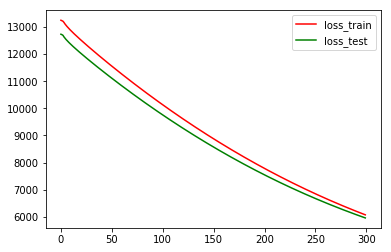

Test MSE: 5963.232                                                                                                     
Test MAE: 62.846                                                                                                       
Test R2: -0.700                                                                                                        
Test RMSE: 77.222                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 10640.0658 - val_loss: 11755.9096                                                                        

Epoch 64/300                                                                                                           
 - 1s - loss: 10612.1735 - val_loss: 11726.3758                                                                        

Epoch 65/300                                                                                                           
 - 1s - loss: 10584.3525 - val_loss: 11696.9143                                                                        

Epoch 66/300                                                                                                           
 - 1s - loss: 10556.6015 - val_loss: 11667.5231                                                                        

Epoch 67/300                                                                                                           
 - 1s - loss: 10528.9210 - val_loss:

 - 1s - loss: 8921.8150 - val_loss: 9929.8845                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 8898.4284 - val_loss: 9904.9256                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 8875.1070 - val_loss: 9880.0337                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 8851.8506 - val_loss: 9855.2067                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 8828.6573 - val_loss: 

 - 2s - loss: 7496.0635 - val_loss: 8401.5423                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 7476.9076 - val_loss: 8380.9011                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 7457.8129 - val_loss: 8360.3203                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 7438.7790 - val_loss: 8339.8030                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 7419.8063 - val_loss: 

 - 2s - loss: 6343.8142 - val_loss: 7153.0172                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 6328.5733 - val_loss: 7136.3947                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 6313.3870 - val_loss: 7119.8258                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 6298.2558 - val_loss: 7103.3155                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 6283.1805 - val_loss: 

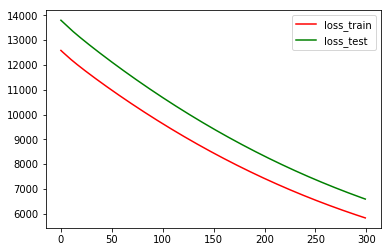

Test MSE: 6589.899                                                                                                     
Test MAE: 65.933                                                                                                       
Test R2: -0.932                                                                                                        
Test RMSE: 81.178                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 9677.7612 - val_loss: 11099.6284                                                                         

Epoch 64/300                                                                                                           
 - 2s - loss: 9651.1812 - val_loss: 11071.5383                                                                         

Epoch 65/300                                                                                                           
 - 1s - loss: 9624.6737 - val_loss: 11043.5215                                                                         

Epoch 66/300                                                                                                           
 - 1s - loss: 9598.2382 - val_loss: 11015.5771                                                                         

Epoch 67/300                                                                                                           
 - 1s - loss: 9571.8748 - val_loss: 

 - 2s - loss: 8048.4461 - val_loss: 9371.2697                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 8026.3846 - val_loss: 9347.7642                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 8004.3877 - val_loss: 9324.3269                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 7982.4557 - val_loss: 9300.9545                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 7960.5890 - val_loss: 

 - 1s - loss: 6710.6946 - val_loss: 7939.5297                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 6692.8356 - val_loss: 7920.3118                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 6675.0372 - val_loss: 7901.1560                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 6657.2996 - val_loss: 7882.0620                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 6639.6215 - val_loss: 

 - 2s - loss: 5643.7047 - val_loss: 6784.7464                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 5629.7044 - val_loss: 6769.4914                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 5615.7608 - val_loss: 6754.2887                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 5601.8688 - val_loss: 6739.1450                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 5588.0340 - val_loss: 

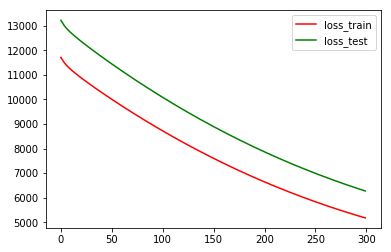

Test MSE: 6270.156                                                                                                     
Test MAE: 65.882                                                                                                       
Test R2: -0.768                                                                                                        
Test RMSE: 79.184                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 10088.7241 - val_loss: 11928.2333                                                                        

Epoch 64/300                                                                                                           
 - 1s - loss: 10060.8775 - val_loss: 11898.1847                                                                        

Epoch 65/300                                                                                                           
 - 2s - loss: 10033.1028 - val_loss: 11868.2094                                                                        

Epoch 66/300                                                                                                           
 - 2s - loss: 10005.4003 - val_loss: 11838.3073                                                                        

Epoch 67/300                                                                                                           
 - 1s - loss: 9977.7697 - val_loss: 

 - 1s - loss: 8375.9778 - val_loss: 10070.9506                                                                         

Epoch 131/300                                                                                                          
 - 2s - loss: 8352.7048 - val_loss: 10045.5687                                                                         

Epoch 132/300                                                                                                          
 - 2s - loss: 8329.4975 - val_loss: 10020.2542                                                                         

Epoch 133/300                                                                                                          
 - 2s - loss: 8306.3556 - val_loss: 9995.0069                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 8283.2800 - val_loss: 

 - 2s - loss: 6959.8670 - val_loss: 8517.1810                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 6940.8883 - val_loss: 8496.2070                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 6921.9712 - val_loss: 8475.2977                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 6903.1149 - val_loss: 8454.4502                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 6884.3211 - val_loss: 

 - 2s - loss: 5821.5330 - val_loss: 7249.6536                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 5806.5310 - val_loss: 7232.7971                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 5791.5862 - val_loss: 7215.9963                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 5776.6956 - val_loss: 7199.2577                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 5761.8635 - val_loss: 

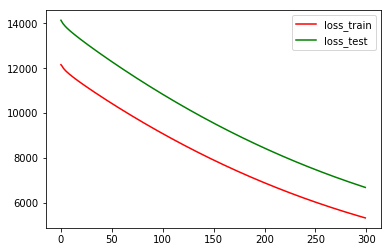

Test MSE: 6679.153                                                                                                     
Test MAE: 67.462                                                                                                       
Test R2: -0.907                                                                                                        
Test RMSE: 81.726                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 4702.3492 - val_loss: 5026.6132                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 4653.7281 - val_loss: 4978.4302                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 4606.1412 - val_loss: 4931.2757                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4559.5759 - val_loss: 4885.1373                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 4514.0188 - val_loss: 

 - 1s - loss: 3101.3766 - val_loss: 3442.3180                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3093.7506 - val_loss: 3434.7793                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3086.3711 - val_loss: 3427.4851                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3079.2319 - val_loss: 3420.4279                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3072.3258 - val_loss: 

 - 1s - loss: 2897.5564 - val_loss: 3240.4776                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2896.8254 - val_loss: 3239.7476                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2896.1202 - val_loss: 3239.0439                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2895.4405 - val_loss: 3238.3646                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2894.7846 - val_loss: 

 - 2s - loss: 2878.8224 - val_loss: 3221.6196                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2878.7579 - val_loss: 3221.5529                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2878.6956 - val_loss: 3221.4883                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2878.6358 - val_loss: 3221.4260                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2878.5777 - val_loss: 

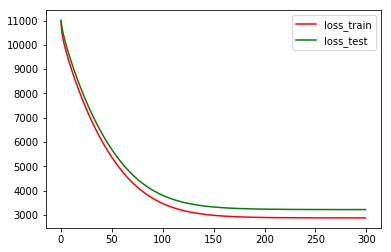

Test MSE: 3220.229                                                                                                     
Test MAE: 50.639                                                                                                       
Test R2: -0.000                                                                                                        
Test RMSE: 56.747                                                                                                      
Accuracy: 0.143                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 9769.7436 - val_loss: 11361.6303                                                                         

Epoch 64/300                                                                                                           
 - 2s - loss: 9743.4396 - val_loss: 11332.4150                                                                         

Epoch 65/300                                                                                                           
 - 2s - loss: 9717.2084 - val_loss: 11303.2739                                                                         

Epoch 66/300                                                                                                           
 - 2s - loss: 9691.0490 - val_loss: 11274.2072                                                                         

Epoch 67/300                                                                                                           
 - 1s - loss: 9664.9617 - val_loss: 

 - 2s - loss: 8158.1677 - val_loss: 9559.4835                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 8136.3535 - val_loss: 9534.8968                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 8114.6033 - val_loss: 9510.3763                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 8092.9183 - val_loss: 9485.9245                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 8071.2981 - val_loss: 

 - 2s - loss: 6835.5548 - val_loss: 8056.3627                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 6817.8983 - val_loss: 8036.0976                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 6800.3009 - val_loss: 8015.8959                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 6782.7638 - val_loss: 7995.7564                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 6765.2863 - val_loss: 

 - 2s - loss: 5780.3809 - val_loss: 6832.8073                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 5766.5301 - val_loss: 6816.5440                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 5752.7333 - val_loss: 6800.3429                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 5738.9917 - val_loss: 6784.1972                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 5725.3008 - val_loss: 

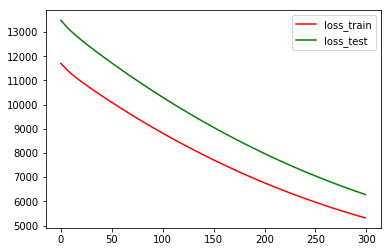

Test MSE: 6282.572                                                                                                     
Test MAE: 65.879                                                                                                       
Test R2: -1.045                                                                                                        
Test RMSE: 79.263                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 38, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 38, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 10211.7780 - val_loss: 9760.4141                                                                         

Epoch 64/300                                                                                                           
 - 1s - loss: 10184.0198 - val_loss: 9733.7663                                                                         

Epoch 65/300                                                                                                           
 - 1s - loss: 10156.3339 - val_loss: 9707.1896                                                                         

Epoch 66/300                                                                                                           
 - 2s - loss: 10128.7196 - val_loss: 9680.6839                                                                         

Epoch 67/300                                                                                                           
 - 1s - loss: 10101.1773 - val_loss:

 - 1s - loss: 8504.3645 - val_loss: 8125.6123                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 8481.1616 - val_loss: 8103.4657                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 8458.0222 - val_loss: 8081.3836                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 8434.9497 - val_loss: 8059.3669                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 8411.9411 - val_loss: 

 - 1s - loss: 7092.0803 - val_loss: 6782.3375                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 7073.1443 - val_loss: 6764.4004                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 7054.2702 - val_loss: 6746.5247                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 7035.4577 - val_loss: 6728.7107                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 7016.7067 - val_loss: 

 - 2s - loss: 5955.7451 - val_loss: 5710.6892                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 5940.7585 - val_loss: 5696.6346                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 5925.8293 - val_loss: 5682.6295                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 5910.9546 - val_loss: 5668.6832                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 5896.1356 - val_loss: 

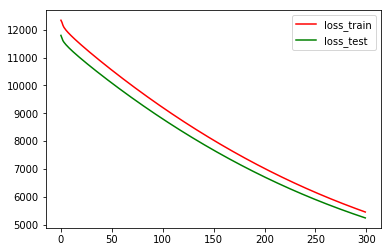

Test MSE: 5238.451                                                                                                     
Test MAE: 59.566                                                                                                       
Test R2: -0.705                                                                                                        
Test RMSE: 72.377                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 39, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 39, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 6225.0800 - val_loss: 6191.7878                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 6166.8782 - val_loss: 6134.9392                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 6109.4992 - val_loss: 6078.9074                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 6052.9360 - val_loss: 6023.6835                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5997.1829 - val_loss: 

 - 1s - loss: 3839.4526 - val_loss: 3878.6590                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3822.0335 - val_loss: 3862.0220                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3804.9944 - val_loss: 3845.7555                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3788.3271 - val_loss: 3829.8525                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3772.0254 - val_loss: 

 - 2s - loss: 3247.0512 - val_loss: 3321.6192                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3243.7238 - val_loss: 3318.6095                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 3240.4842 - val_loss: 3315.6813                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 3237.3298 - val_loss: 3312.8351                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 3234.2587 - val_loss: 

 - 2s - loss: 3142.9004 - val_loss: 3231.0311                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 3142.3690 - val_loss: 3230.6171                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 3141.8522 - val_loss: 3230.2159                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 3141.3495 - val_loss: 3229.8271                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 3140.8604 - val_loss: 

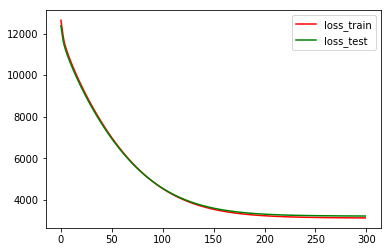

Test MSE: 3222.087                                                                                                     
Test MAE: 48.856                                                                                                       
Test R2: -0.001                                                                                                        
Test RMSE: 56.763                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 30, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 30, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5497.0851 - val_loss: 5133.1380                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5467.8031 - val_loss: 5106.8632                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5438.6730 - val_loss: 5080.7358                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5409.6940 - val_loss: 5054.7555                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5380.8656 - val_loss: 

 - 1s - loss: 3854.8538 - val_loss: 3682.7444                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3835.0370 - val_loss: 3665.6261                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3815.3501 - val_loss: 3648.6322                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3795.7950 - val_loss: 3631.7644                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3776.3703 - val_loss: 

 - 1s - loss: 2798.6755 - val_loss: 2793.8252                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2786.7679 - val_loss: 2784.1833                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2774.9625 - val_loss: 2774.6374                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2763.2600 - val_loss: 2765.1856                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2751.6590 - val_loss: 

 - 2s - loss: 2202.7977 - val_loss: 2332.5747                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2196.5974 - val_loss: 2328.1106                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2190.4649 - val_loss: 2323.7063                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2184.3993 - val_loss: 2319.3595                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2178.3991 - val_loss: 

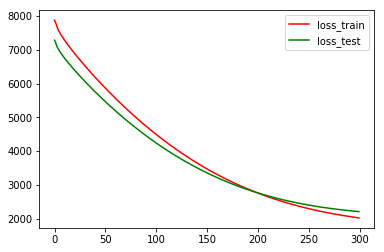

Test MSE: 2205.103                                                                                                     
Test MAE: 40.972                                                                                                       
Test R2: -0.066                                                                                                        
Test RMSE: 46.959                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 31, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 31, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3955.2779 - val_loss: 3218.1190                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 3919.7926 - val_loss: 3184.2380                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 3884.8782 - val_loss: 3150.9181                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3850.5295 - val_loss: 3118.1534                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3816.7409 - val_loss: 

 - 1s - loss: 2582.2719 - val_loss: 1928.3645                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 2573.1604 - val_loss: 1920.1158                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2564.2664 - val_loss: 1912.0748                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2555.5869 - val_loss: 1904.2379                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2547.1169 - val_loss: 

 - 1s - loss: 2287.3149 - val_loss: 1671.9572                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2285.7785 - val_loss: 1670.7638                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2284.2849 - val_loss: 1669.6079                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2282.8326 - val_loss: 1668.4888                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2281.4205 - val_loss: 

 - 2s - loss: 2240.6167 - val_loss: 1639.9522                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2240.3900 - val_loss: 1639.8525                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2240.1695 - val_loss: 1639.7575                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2239.9554 - val_loss: 1639.6669                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2239.7473 - val_loss: 

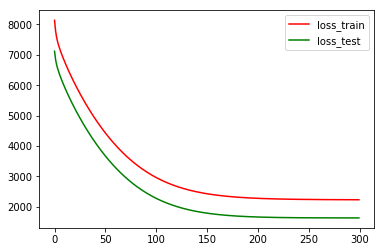

Test MSE: 1638.374                                                                                                     
Test MAE: 34.315                                                                                                       
Test R2: -0.000                                                                                                        
Test RMSE: 40.477                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5676.9872 - val_loss: 5291.8719                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5634.1367 - val_loss: 5252.8573                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5591.6630 - val_loss: 5214.2096                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5549.5646 - val_loss: 5175.9275                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5507.8408 - val_loss: 

 - 2s - loss: 3567.9489 - val_loss: 3414.3155                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3546.9566 - val_loss: 3396.3279                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3526.2295 - val_loss: 3378.5912                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3505.7691 - val_loss: 3361.1060                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3485.5709 - val_loss: 

 - 2s - loss: 2652.1259 - val_loss: 2665.1387                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2644.4328 - val_loss: 2659.3933                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2636.8696 - val_loss: 2653.7624                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2629.4342 - val_loss: 2648.2438                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2622.1255 - val_loss: 

 - 1s - loss: 2349.5331 - val_loss: 2462.1897                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2347.3001 - val_loss: 2461.0280                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2345.1101 - val_loss: 2459.8994                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2342.9625 - val_loss: 2458.8028                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2340.8568 - val_loss: 

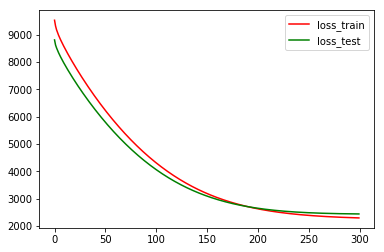

Test MSE: 2436.737                                                                                                     
Test MAE: 43.816                                                                                                       
Test R2: -0.002                                                                                                        
Test RMSE: 49.363                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 4719.6613 - val_loss: 4832.5344                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 4668.6893 - val_loss: 4777.3399                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 4618.7868 - val_loss: 4723.2454                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 4569.9410 - val_loss: 4670.2378                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 4522.1375 - val_loss: 

 - 2s - loss: 3032.9562 - val_loss: 2935.9103                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3024.9136 - val_loss: 2925.8535                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3017.1333 - val_loss: 2916.0887                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3009.6082 - val_loss: 2906.6084                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3002.3300 - val_loss: 

 - 2s - loss: 2819.4743 - val_loss: 2639.1345                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2818.7239 - val_loss: 2637.7257                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2817.9999 - val_loss: 2636.3565                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2817.3026 - val_loss: 2635.0241                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2816.6300 - val_loss: 

 - 1s - loss: 2800.4267 - val_loss: 2594.3263                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2800.3627 - val_loss: 2594.0679                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2800.3010 - val_loss: 2593.8156                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2800.2415 - val_loss: 2593.5689                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2800.1840 - val_loss: 

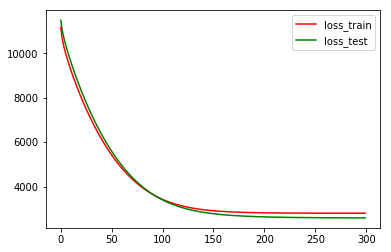

Test MSE: 2587.870                                                                                                     
Test MAE: 44.290                                                                                                       
Test R2: -0.009                                                                                                        
Test RMSE: 50.871                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 4827.3627 - val_loss: 5387.1323                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 4779.0190 - val_loss: 5328.2249                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 4731.6973 - val_loss: 5270.4218                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 4685.3849 - val_loss: 5213.7093                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 4640.0681 - val_loss: 

 - 1s - loss: 3225.6720 - val_loss: 3269.1127                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3217.8988 - val_loss: 3256.4726                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3210.3724 - val_loss: 3244.1514                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3203.0861 - val_loss: 3232.1432                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3196.0334 - val_loss: 

 - 1s - loss: 3015.1309 - val_loss: 2857.3942                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 3014.3533 - val_loss: 2855.0142                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 3013.6027 - val_loss: 2852.6910                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3012.8785 - val_loss: 2850.4188                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 3012.1793 - val_loss: 

 - 2s - loss: 2994.9481 - val_loss: 2773.7551                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2994.8769 - val_loss: 2773.1968                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2994.8080 - val_loss: 2772.6479                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2994.7417 - val_loss: 2772.1107                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2994.6778 - val_loss: 

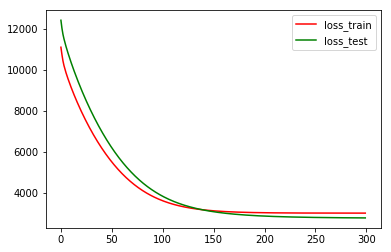

Test MSE: 2759.222                                                                                                     
Test MAE: 43.729                                                                                                       
Test R2: -0.042                                                                                                        
Test RMSE: 52.528                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5356.2650 - val_loss: 3706.9559                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5304.7733 - val_loss: 3667.0553                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5254.0735 - val_loss: 3627.8843                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5204.1583 - val_loss: 3589.4344                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5155.0207 - val_loss: 

 - 2s - loss: 3328.8439 - val_loss: 2301.1347                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3315.0933 - val_loss: 2294.1280                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3301.6678 - val_loss: 2287.3733                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3288.5637 - val_loss: 2280.8653                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3275.7730 - val_loss: 

 - 2s - loss: 2882.9782 - val_loss: 2165.3209                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2880.6717 - val_loss: 2165.8590                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2878.4299 - val_loss: 2166.4219                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2876.2503 - val_loss: 2167.0081                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2874.1331 - val_loss: 

 - 2s - loss: 2813.4885 - val_loss: 2218.8777                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2813.1568 - val_loss: 2219.6190                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2812.8349 - val_loss: 2220.3538                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2812.5227 - val_loss: 2221.0825                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2812.2195 - val_loss: 

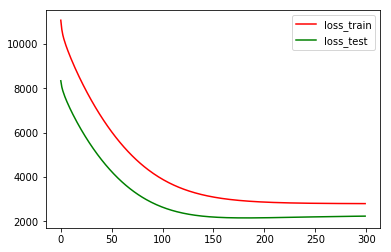

Test MSE: 2241.563                                                                                                     
Test MAE: 39.328                                                                                                       
Test R2: -0.037                                                                                                        
Test RMSE: 47.345                                                                                                      
Accuracy: 0.357                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 4455.1468 - val_loss: 5403.4751                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 4410.5509 - val_loss: 5358.6557                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 4366.7124 - val_loss: 5314.5939                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 4323.6265 - val_loss: 5271.2851                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 4281.2845 - val_loss: 

 - 2s - loss: 2789.2073 - val_loss: 3723.2143                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 2779.0023 - val_loss: 3712.8146                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 2769.0658 - val_loss: 3702.6856                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2759.3936 - val_loss: 3692.8207                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2749.9777 - val_loss: 

 - 2s - loss: 2478.8837 - val_loss: 3402.6555                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2477.4580 - val_loss: 3401.1231                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2476.0761 - val_loss: 3399.6360                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2474.7362 - val_loss: 3398.1923                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2473.4373 - val_loss: 

 - 1s - loss: 2438.3512 - val_loss: 3357.3631                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2438.1790 - val_loss: 3357.1485                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2438.0122 - val_loss: 3356.9400                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2437.8503 - val_loss: 3356.7370                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2437.6937 - val_loss: 

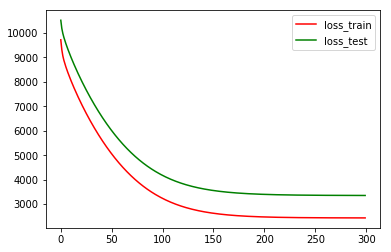

Test MSE: 3352.427                                                                                                     
Test MAE: 50.891                                                                                                       
Test R2: -0.001                                                                                                        
Test RMSE: 57.900                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 4422.3292 - val_loss: 6814.2367                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 4380.0322 - val_loss: 6752.3644                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 4338.4674 - val_loss: 6691.3458                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 4297.6286 - val_loss: 6631.1746                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 4257.5079 - val_loss: 

 - 2s - loss: 2852.2844 - val_loss: 4225.6090                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2842.7116 - val_loss: 4205.4469                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 2833.3909 - val_loss: 4185.6643                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2824.3162 - val_loss: 4166.2553                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 2815.4824 - val_loss: 

 - 2s - loss: 2559.6742 - val_loss: 3460.7464                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2558.3077 - val_loss: 3455.2074                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2556.9826 - val_loss: 3449.7724                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2555.6978 - val_loss: 3444.4392                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2554.4516 - val_loss: 

 - 2s - loss: 2520.3959 - val_loss: 3245.0417                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2520.2249 - val_loss: 3243.3784                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2520.0589 - val_loss: 3241.7439                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2519.8983 - val_loss: 3240.1401                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2519.7429 - val_loss: 

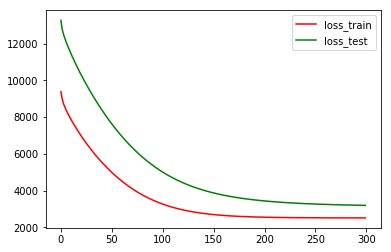

Test MSE: 3199.883                                                                                                     
Test MAE: 48.198                                                                                                       
Test R2: -0.176                                                                                                        
Test RMSE: 56.568                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5338.2351 - val_loss: 5030.0595                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5283.1759 - val_loss: 4980.3994                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5228.9462 - val_loss: 4931.5398                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5175.5377 - val_loss: 4883.4735                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5122.9453 - val_loss: 

 - 2s - loss: 3158.1122 - val_loss: 3140.5409                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3143.3316 - val_loss: 3128.9066                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3128.9042 - val_loss: 3117.5916                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3114.8255 - val_loss: 3106.5898                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3101.0892 - val_loss: 

 - 2s - loss: 2685.4933 - val_loss: 2810.7354                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2683.1396 - val_loss: 2809.6617                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2680.8545 - val_loss: 2808.6372                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2678.6357 - val_loss: 2807.6609                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2676.4817 - val_loss: 

 - 2s - loss: 2616.5087 - val_loss: 2796.0680                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2616.1985 - val_loss: 2796.2193                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2615.8976 - val_loss: 2796.3729                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2615.6059 - val_loss: 2796.5287                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2615.3233 - val_loss: 

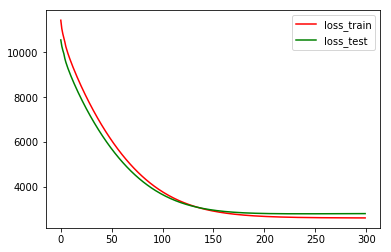

Test MSE: 2802.055                                                                                                     
Test MAE: 47.286                                                                                                       
Test R2: -0.003                                                                                                        
Test RMSE: 52.934                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5642.1614 - val_loss: 5004.9195                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5583.1115 - val_loss: 4952.8740                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5524.9135 - val_loss: 4901.6475                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5467.5624 - val_loss: 4851.2338                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5411.0518 - val_loss: 

 - 2s - loss: 3261.3734 - val_loss: 3006.7963                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3244.7385 - val_loss: 2994.3929                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3228.4908 - val_loss: 2982.3318                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3212.6245 - val_loss: 2970.6078                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3197.1326 - val_loss: 

 - 1s - loss: 2721.8578 - val_loss: 2662.0143                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2719.1158 - val_loss: 2661.0436                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2716.4529 - val_loss: 2660.1264                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2713.8661 - val_loss: 2659.2603                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2711.3542 - val_loss: 

 - 2s - loss: 2640.9815 - val_loss: 2656.7539                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2640.6141 - val_loss: 2657.0329                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2640.2575 - val_loss: 2657.3132                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2639.9119 - val_loss: 2657.5943                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2639.5768 - val_loss: 

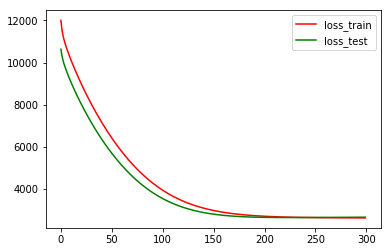

Test MSE: 2666.628                                                                                                     
Test MAE: 44.925                                                                                                       
Test R2: -0.006                                                                                                        
Test RMSE: 51.639                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5730.6720 - val_loss: 3763.2584                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5672.4056 - val_loss: 3722.1354                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5614.9822 - val_loss: 3681.7727                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5558.3953 - val_loss: 3642.1640                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5502.6382 - val_loss: 

 - 2s - loss: 3378.1406 - val_loss: 2349.4535                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3361.5935 - val_loss: 2343.3593                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3345.4290 - val_loss: 2337.5391                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3329.6370 - val_loss: 2331.9849                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3314.2135 - val_loss: 

 - 2s - loss: 2836.3699 - val_loss: 2294.2486                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2833.5554 - val_loss: 2295.9404                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2830.8199 - val_loss: 2297.6488                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 2828.1624 - val_loss: 2299.3715                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2825.5796 - val_loss: 

 - 2s - loss: 2752.2499 - val_loss: 2404.8950                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2751.8575 - val_loss: 2406.1960                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2751.4768 - val_loss: 2407.4831                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2751.1070 - val_loss: 2408.7569                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2750.7483 - val_loss: 

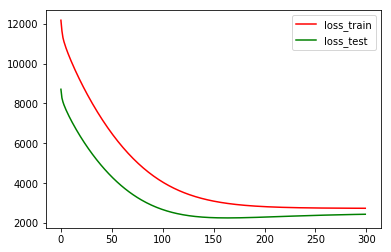

Test MSE: 2443.609                                                                                                     
Test MAE: 41.059                                                                                                       
Test R2: -0.081                                                                                                        
Test RMSE: 49.433                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 34, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 34, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5216.6868 - val_loss: 4908.3420                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5173.8813 - val_loss: 4866.4446                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5131.5672 - val_loss: 4825.0342                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5089.7418 - val_loss: 4784.1077                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5048.4011 - val_loss: 

 - 2s - loss: 3294.2332 - val_loss: 3037.2738                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3277.6927 - val_loss: 3021.3407                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3261.4330 - val_loss: 3005.6844                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3245.4505 - val_loss: 2990.2979                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3229.7417 - val_loss: 

 - 1s - loss: 2655.0019 - val_loss: 2428.2654                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2650.5384 - val_loss: 2424.1088                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2646.1698 - val_loss: 2420.0437                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2641.8948 - val_loss: 2416.0687                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2637.7113 - val_loss: 

 - 2s - loss: 2497.5036 - val_loss: 2284.9679                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2496.5158 - val_loss: 2284.1163                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2495.5517 - val_loss: 2283.2853                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2494.6083 - val_loss: 2282.4752                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2493.6878 - val_loss: 

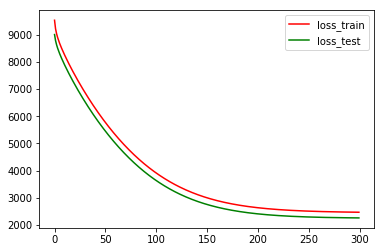

Test MSE: 2264.577                                                                                                     
Test MAE: 40.125                                                                                                       
Test R2: -0.005                                                                                                        
Test RMSE: 47.588                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 6618.1349 - val_loss: 6813.2146                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 6589.2438 - val_loss: 6782.3776                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 6560.4991 - val_loss: 6751.6903                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 6531.9002 - val_loss: 6721.1503                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 6503.4455 - val_loss: 

 - 2s - loss: 4985.5011 - val_loss: 5056.7131                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 4965.5388 - val_loss: 5035.0119                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 4945.6974 - val_loss: 5013.4332                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 4925.9779 - val_loss: 4991.9822                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 4906.3806 - val_loss: 

 - 2s - loss: 3899.8863 - val_loss: 3862.9210                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 3887.2556 - val_loss: 3848.8134                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 3874.7207 - val_loss: 3834.8055                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3862.2806 - val_loss: 3820.8960                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 3849.9345 - val_loss: 

 - 2s - loss: 3242.8946 - val_loss: 3116.7047                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 3235.6536 - val_loss: 3108.2854                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 3228.4773 - val_loss: 3099.9340                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 3221.3648 - val_loss: 3091.6514                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 3214.3174 - val_loss: 

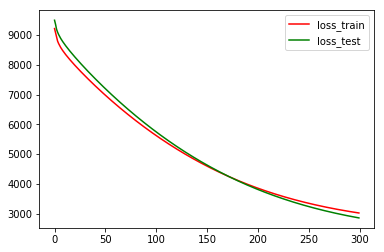

Test MSE: 2854.265                                                                                                     
Test MAE: 43.474                                                                                                       
Test R2: -0.328                                                                                                        
Test RMSE: 53.425                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 32, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 32, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 3510.1781 - val_loss: 3728.1034                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 3476.8671 - val_loss: 3688.9668                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 3444.2196 - val_loss: 3650.5367                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 3412.2276 - val_loss: 3612.8041                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 3380.8831 - val_loss: 

 - 2s - loss: 2363.0621 - val_loss: 2289.8695                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2356.9889 - val_loss: 2280.9428                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2351.0957 - val_loss: 2272.2349                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 2345.3770 - val_loss: 2263.7402                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 2339.8283 - val_loss: 

 - 1s - loss: 2190.1565 - val_loss: 1994.9651                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2189.4474 - val_loss: 1993.2374                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2188.7620 - val_loss: 1991.5491                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2188.0990 - val_loss: 1989.8985                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2187.4572 - val_loss: 

 - 1s - loss: 2170.8771 - val_loss: 1934.0192                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2170.8019 - val_loss: 1933.6081                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2170.7292 - val_loss: 1933.2065                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2170.6588 - val_loss: 1932.8115                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2170.5909 - val_loss: 

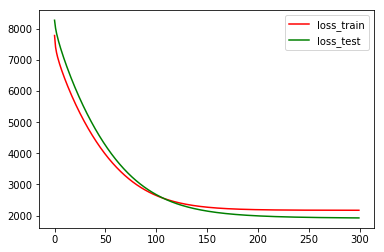

Test MSE: 1923.284                                                                                                     
Test MAE: 36.975                                                                                                       
Test R2: -0.031                                                                                                        
Test RMSE: 43.855                                                                                                      
Accuracy: 0.310                                                                                                        
(98, 35, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 35, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 6081.9144 - val_loss: 6841.1999                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 6047.9653 - val_loss: 6800.8389                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 6014.2564 - val_loss: 6760.7314                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5980.7862 - val_loss: 6720.8766                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5947.5543 - val_loss: 

 - 2s - loss: 4297.4103 - val_loss: 4660.5684                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 4277.6756 - val_loss: 4635.4888                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 4258.1250 - val_loss: 4610.6113                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 4238.7555 - val_loss: 4585.9348                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 4219.5680 - val_loss: 

 - 2s - loss: 3331.0113 - val_loss: 3378.8178                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 3321.2760 - val_loss: 3365.0561                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 3311.6545 - val_loss: 3351.4283                                                                          

Epoch 200/300                                                                                                          
 - 1s - loss: 3302.1468 - val_loss: 3337.9355                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3292.7508 - val_loss: 

 - 2s - loss: 2885.6048 - val_loss: 2707.2562                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2881.4752 - val_loss: 2700.3887                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2877.4021 - val_loss: 2693.5953                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2873.3846 - val_loss: 2686.8750                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2869.4219 - val_loss: 

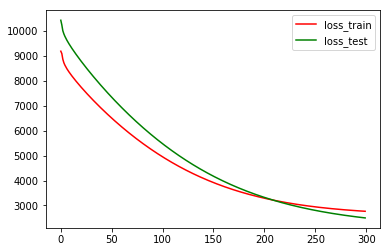

Test MSE: 2501.365                                                                                                     
Test MAE: 42.688                                                                                                       
Test R2: -0.309                                                                                                        
Test RMSE: 50.014                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 38, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 38, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5615.3392 - val_loss: 6019.9781                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5560.8728 - val_loss: 5964.3306                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5507.2170 - val_loss: 5909.4974                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5454.3650 - val_loss: 5855.4731                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5402.3106 - val_loss: 

 - 2s - loss: 3439.7166 - val_loss: 3777.6084                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3424.6054 - val_loss: 3761.7135                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3409.8434 - val_loss: 3746.1748                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3395.4259 - val_loss: 3730.9869                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3381.3454 - val_loss: 

 - 1s - loss: 2944.1346 - val_loss: 3243.4636                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2941.5300 - val_loss: 3240.4754                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2938.9973 - val_loss: 3237.5644                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2936.5350 - val_loss: 3234.7285                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2934.1424 - val_loss: 

 - 2s - loss: 2865.4031 - val_loss: 3147.5449                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2865.0271 - val_loss: 3147.0129                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2864.6620 - val_loss: 3146.4938                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2864.3073 - val_loss: 3145.9875                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2863.9629 - val_loss: 

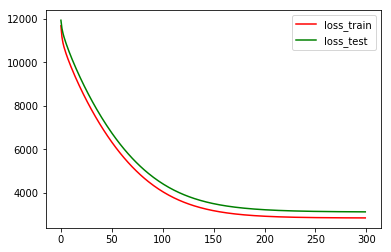

Test MSE: 3134.639                                                                                                     
Test MAE: 48.686                                                                                                       
Test R2: -0.004                                                                                                        
Test RMSE: 55.988                                                                                                      
Accuracy: 0.190                                                                                                        
(98, 30, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 30, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 2951.9139 - val_loss: 2830.4934                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 2918.1670 - val_loss: 2802.1419                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 2885.2311 - val_loss: 2774.5505                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 2853.0936 - val_loss: 2747.7060                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 2821.7430 - val_loss: 

 - 1s - loss: 1929.6879 - val_loss: 2053.2029                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 1925.7087 - val_loss: 2051.2441                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 1921.8785 - val_loss: 2049.3963                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 1918.1916 - val_loss: 2047.6545                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 1914.6432 - val_loss: 

 - 1s - loss: 1833.9280 - val_loss: 2033.1222                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 1833.6576 - val_loss: 2033.3745                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 1833.3980 - val_loss: 2033.6271                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 1833.1491 - val_loss: 2033.8797                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 1832.9101 - val_loss: 

 - 1s - loss: 1827.6621 - val_loss: 2045.9879                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 1827.6452 - val_loss: 2046.1019                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 1827.6289 - val_loss: 2046.2134                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 1827.6134 - val_loss: 2046.3229                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 1827.5985 - val_loss: 

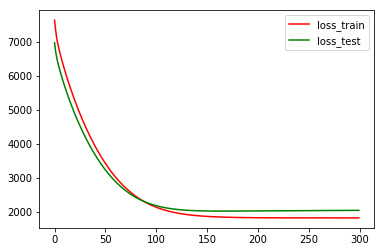

Test MSE: 2049.010                                                                                                     
Test MAE: 38.676                                                                                                       
Test R2: -0.011                                                                                                        
Test RMSE: 45.266                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5510.6779 - val_loss: 7187.2732                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5463.0927 - val_loss: 7126.2631                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5416.1381 - val_loss: 7065.9411                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5369.8080 - val_loss: 7006.3027                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5324.0990 - val_loss: 

 - 2s - loss: 3496.4765 - val_loss: 4421.8204                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3480.8131 - val_loss: 4397.4197                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 3465.4604 - val_loss: 4373.4052                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3450.4141 - val_loss: 4349.7733                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3435.6700 - val_loss: 

 - 2s - loss: 2935.3134 - val_loss: 3429.1118                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2931.8477 - val_loss: 3421.2851                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2928.4652 - val_loss: 3413.5934                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2925.1649 - val_loss: 3406.0362                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2921.9447 - val_loss: 

 - 2s - loss: 2820.8794 - val_loss: 3113.5209                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2820.2367 - val_loss: 3110.9688                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2819.6103 - val_loss: 3108.4581                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2818.9998 - val_loss: 3105.9864                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2818.4045 - val_loss: 

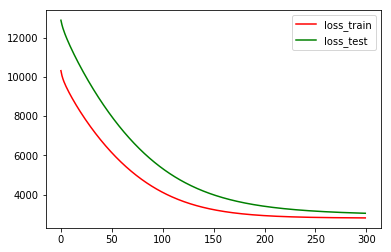

Test MSE: 3042.769                                                                                                     
Test MAE: 46.579                                                                                                       
Test R2: -0.122                                                                                                        
Test RMSE: 55.161                                                                                                      
Accuracy: 0.262                                                                                                        
(98, 31, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 31, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5556.3842 - val_loss: 5776.0830                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5527.3333 - val_loss: 5748.1506                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5498.4317 - val_loss: 5720.3659                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5469.6789 - val_loss: 5692.7286                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5441.0747 - val_loss: 

 - 2s - loss: 3926.4006 - val_loss: 4217.3725                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3906.7244 - val_loss: 4198.6976                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3887.1784 - val_loss: 4180.1509                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3867.7620 - val_loss: 4161.7299                                                                          

Epoch 134/300                                                                                                          
 - 1s - loss: 3848.4727 - val_loss: 

 - 1s - loss: 2876.7952 - val_loss: 3229.6846                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2864.9404 - val_loss: 3218.6665                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2853.1870 - val_loss: 3207.7480                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2841.5350 - val_loss: 3196.9269                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2829.9829 - val_loss: 

 - 1s - loss: 2281.9372 - val_loss: 2684.4257                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2275.7202 - val_loss: 2678.8466                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2269.5691 - val_loss: 2673.3296                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2263.4835 - val_loss: 2667.8758                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2257.4625 - val_loss: 

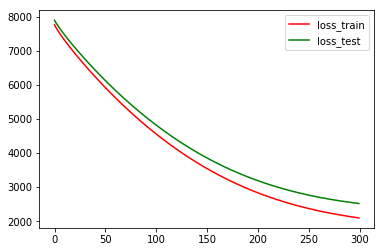

Test MSE: 2519.582                                                                                                     
Test MAE: 42.127                                                                                                       
Test R2: -0.111                                                                                                        
Test RMSE: 50.195                                                                                                      
Accuracy: 0.262                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 1s - loss: 5201.8235 - val_loss: 5708.4953                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5164.3280 - val_loss: 5666.9741                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 5127.1905 - val_loss: 5625.8232                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5090.4090 - val_loss: 5585.0395                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5053.9816 - val_loss: 

 - 2s - loss: 3398.2163 - val_loss: 3664.7615                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3380.8167 - val_loss: 3644.2854                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3363.6516 - val_loss: 3624.0606                                                                          

Epoch 133/300                                                                                                          
 - 1s - loss: 3346.7201 - val_loss: 3604.0863                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3330.0203 - val_loss: 

 - 1s - loss: 2654.1341 - val_loss: 2751.3267                                                                          

Epoch 198/300                                                                                                          
 - 1s - loss: 2648.0253 - val_loss: 2743.2461                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2642.0219 - val_loss: 2735.2866                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2636.1229 - val_loss: 2727.4467                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2630.3262 - val_loss: 

 - 1s - loss: 2415.2685 - val_loss: 2411.1379                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2413.5090 - val_loss: 2408.2791                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2411.7835 - val_loss: 2405.4645                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2410.0910 - val_loss: 2402.6923                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2408.4309 - val_loss: 

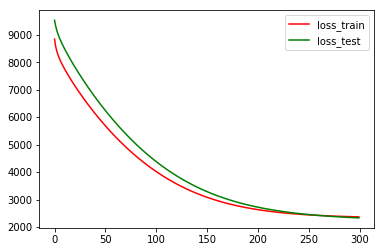

Test MSE: 2331.544                                                                                                     
Test MAE: 43.317                                                                                                       
Test R2: -0.073                                                                                                        
Test RMSE: 48.286                                                                                                      
Accuracy: 0.167                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5505.7248 - val_loss: 5792.1124                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 5452.1902 - val_loss: 5737.6986                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5399.4629 - val_loss: 5684.0940                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5347.5351 - val_loss: 5631.2931                                                                          

Epoch 67/300                                                                                                           
 - 1s - loss: 5296.4012 - val_loss: 

 - 1s - loss: 3379.3840 - val_loss: 3615.6067                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3364.7665 - val_loss: 3600.3924                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3350.4911 - val_loss: 3585.5256                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3336.5524 - val_loss: 3570.9993                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3322.9433 - val_loss: 

 - 2s - loss: 2903.1791 - val_loss: 3109.7469                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2900.7053 - val_loss: 3106.9760                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2898.3003 - val_loss: 3104.2766                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2895.9633 - val_loss: 3101.6499                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2893.6919 - val_loss: 

 - 2s - loss: 2828.8258 - val_loss: 3021.9955                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2828.4746 - val_loss: 3021.5225                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2828.1336 - val_loss: 3021.0615                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2827.8026 - val_loss: 3020.6121                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2827.4813 - val_loss: 

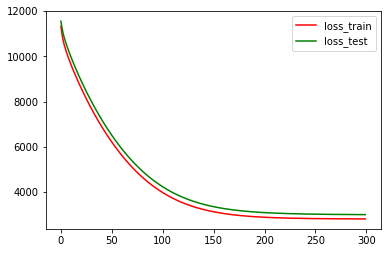

Test MSE: 3010.649                                                                                                     
Test MAE: 46.909                                                                                                       
Test R2: -0.004                                                                                                        
Test RMSE: 54.869                                                                                                      
Accuracy: 0.286                                                                                                        
(98, 33, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 33, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 4952.4771 - val_loss: 4640.0945                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 4905.3657 - val_loss: 4605.3581                                                                          

Epoch 65/300                                                                                                           
 - 1s - loss: 4858.7818 - val_loss: 4571.1072                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 4812.7227 - val_loss: 4537.3399                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 4767.1854 - val_loss: 

 - 1s - loss: 2830.7630 - val_loss: 3239.4874                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 2812.6644 - val_loss: 3230.2165                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 2794.8845 - val_loss: 3221.2014                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 2777.4219 - val_loss: 3212.4388                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 2760.2709 - val_loss: 

 - 2s - loss: 2151.9425 - val_loss: 3011.1961                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2147.5266 - val_loss: 3011.4619                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2143.2135 - val_loss: 3011.7785                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2139.0019 - val_loss: 3012.1442                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2134.8898 - val_loss: 

 - 2s - loss: 2005.1885 - val_loss: 3081.2432                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2004.3666 - val_loss: 3082.4737                                                                          

Epoch 266/300                                                                                                          
 - 1s - loss: 2003.5660 - val_loss: 3083.6994                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2002.7856 - val_loss: 3084.9195                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2002.0254 - val_loss: 

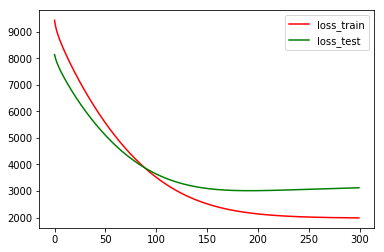

Test MSE: 3121.208                                                                                                     
Test MAE: 51.174                                                                                                       
Test R2: -0.037                                                                                                        
Test RMSE: 55.868                                                                                                      
Accuracy: 0.119                                                                                                        
(98, 34, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 34, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 6967.8925 - val_loss: 7182.5007                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 6936.5720 - val_loss: 7150.1821                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 6905.4011 - val_loss: 7118.0134                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 6874.3785 - val_loss: 7085.9949                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 6843.5043 - val_loss: 

 - 2s - loss: 5182.9035 - val_loss: 5333.5225                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 5160.8597 - val_loss: 5310.5729                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 5138.9441 - val_loss: 5287.7535                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 5117.1569 - val_loss: 5265.0647                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 5095.4964 - val_loss: 

 - 2s - loss: 3973.7123 - val_loss: 4067.6050                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 3959.4997 - val_loss: 4052.6115                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 3945.3911 - val_loss: 4037.7234                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 3931.3854 - val_loss: 4022.9405                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 3917.4830 - val_loss: 

 - 1s - loss: 3229.0893 - val_loss: 3275.3765                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 3220.8190 - val_loss: 3266.4711                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 3212.6216 - val_loss: 3257.6414                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 3204.4977 - val_loss: 3248.8880                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 3196.4460 - val_loss: 

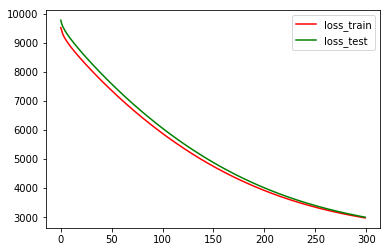

Test MSE: 2998.892                                                                                                     
Test MAE: 46.044                                                                                                       
Test R2: -0.288                                                                                                        
Test RMSE: 54.762                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 32, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 32, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5545.7213 - val_loss: 6114.3350                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5511.0628 - val_loss: 6078.1698                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5476.6523 - val_loss: 6042.2560                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 5442.4891 - val_loss: 6006.5919                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5408.5724 - val_loss: 

 - 2s - loss: 3733.9360 - val_loss: 4208.9724                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3714.1211 - val_loss: 4187.8890                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3694.4964 - val_loss: 4167.0004                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3675.0636 - val_loss: 4146.3095                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3655.8216 - val_loss: 

 - 2s - loss: 2780.1224 - val_loss: 3180.2994                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2770.7955 - val_loss: 3170.0191                                                                          

Epoch 199/300                                                                                                          
 - 1s - loss: 2761.5874 - val_loss: 3159.8625                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2752.4964 - val_loss: 3149.8281                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2743.5210 - val_loss: 

 - 2s - loss: 2366.7713 - val_loss: 2713.7878                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2363.1263 - val_loss: 2709.5074                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2359.5356 - val_loss: 2705.2848                                                                          

Epoch 267/300                                                                                                          
 - 1s - loss: 2355.9990 - val_loss: 2701.1216                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2352.5155 - val_loss: 

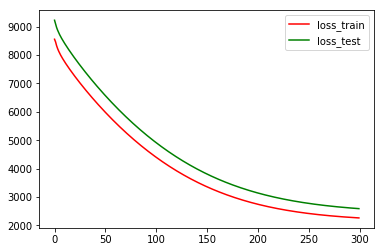

Test MSE: 2591.919                                                                                                     
Test MAE: 44.023                                                                                                       
Test R2: -0.082                                                                                                        
Test RMSE: 50.911                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 36, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 36, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5090.0884 - val_loss: 5693.5146                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5039.6683 - val_loss: 5641.9252                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 4990.0412 - val_loss: 5591.1339                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 4941.1995 - val_loss: 5541.1336                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 4893.1371 - val_loss: 

 - 2s - loss: 3129.8008 - val_loss: 3668.1696                                                                          

Epoch 131/300                                                                                                          
 - 1s - loss: 3116.8614 - val_loss: 3654.4823                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3104.2381 - val_loss: 3641.1191                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3091.9261 - val_loss: 3628.0746                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3079.9184 - val_loss: 

 - 2s - loss: 2719.0609 - val_loss: 3221.5218                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2717.0237 - val_loss: 3219.1392                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2715.0460 - val_loss: 3216.8197                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2713.1258 - val_loss: 3214.5623                                                                          

Epoch 201/300                                                                                                          
 - 1s - loss: 2711.2606 - val_loss: 

 - 2s - loss: 2659.1114 - val_loss: 3146.3515                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2658.8386 - val_loss: 3145.9442                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2658.5742 - val_loss: 3145.5473                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2658.3178 - val_loss: 3145.1603                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2658.0691 - val_loss: 

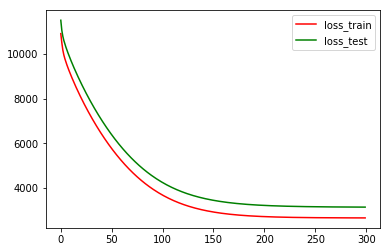

Test MSE: 3136.513                                                                                                     
Test MAE: 48.573                                                                                                       
Test R2: -0.003                                                                                                        
Test RMSE: 56.005                                                                                                      
Accuracy: 0.238                                                                                                        
(98, 37, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 37, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 5514.9242 - val_loss: 7741.6316                                                                          

Epoch 64/300                                                                                                           
 - 2s - loss: 5468.4683 - val_loss: 7677.0820                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 5422.6327 - val_loss: 7613.2355                                                                          

Epoch 66/300                                                                                                           
 - 1s - loss: 5377.4135 - val_loss: 7550.0874                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 5332.8057 - val_loss: 

 - 1s - loss: 3553.0552 - val_loss: 4770.7131                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 3537.8176 - val_loss: 4743.7775                                                                          

Epoch 132/300                                                                                                          
 - 2s - loss: 3522.8823 - val_loss: 4717.2455                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 3508.2445 - val_loss: 4691.1137                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 3493.8994 - val_loss: 

 - 2s - loss: 3005.6898 - val_loss: 3645.7487                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 3002.2831 - val_loss: 3636.4995                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2998.9583 - val_loss: 3627.3969                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2995.7130 - val_loss: 3618.4437                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2992.5450 - val_loss: 

 - 2s - loss: 2892.5093 - val_loss: 3262.1230                                                                          

Epoch 265/300                                                                                                          
 - 2s - loss: 2891.8661 - val_loss: 3258.9014                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2891.2388 - val_loss: 3255.7255                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2890.6271 - val_loss: 3252.5982                                                                          

Epoch 268/300                                                                                                          
 - 1s - loss: 2890.0307 - val_loss: 

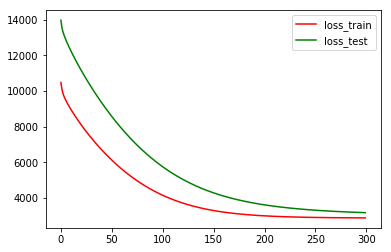

Test MSE: 3171.646                                                                                                     
Test MAE: 49.205                                                                                                       
Test R2: -0.211                                                                                                        
Test RMSE: 56.317                                                                                                      
Accuracy: 0.214                                                                                                        
(98, 35, 1)                                                                                                            
(98, 1)                                                                                                                
(42, 35, 1)                                                                                                            
(42, 1)                                 

 - 2s - loss: 4152.2942 - val_loss: 5270.3955                                                                          

Epoch 64/300                                                                                                           
 - 1s - loss: 4107.4334 - val_loss: 5214.3311                                                                          

Epoch 65/300                                                                                                           
 - 2s - loss: 4063.4674 - val_loss: 5159.2417                                                                          

Epoch 66/300                                                                                                           
 - 2s - loss: 4020.3880 - val_loss: 5105.1195                                                                          

Epoch 67/300                                                                                                           
 - 2s - loss: 3978.1844 - val_loss: 

 - 2s - loss: 2624.5941 - val_loss: 3184.1281                                                                          

Epoch 131/300                                                                                                          
 - 2s - loss: 2616.8710 - val_loss: 3171.0219                                                                          

Epoch 132/300                                                                                                          
 - 1s - loss: 2609.3891 - val_loss: 3158.2374                                                                          

Epoch 133/300                                                                                                          
 - 2s - loss: 2602.1430 - val_loss: 3145.7643                                                                          

Epoch 134/300                                                                                                          
 - 2s - loss: 2595.1245 - val_loss: 

 - 2s - loss: 2413.8924 - val_loss: 2749.7669                                                                          

Epoch 198/300                                                                                                          
 - 2s - loss: 2413.1097 - val_loss: 2747.2003                                                                          

Epoch 199/300                                                                                                          
 - 2s - loss: 2412.3540 - val_loss: 2744.6917                                                                          

Epoch 200/300                                                                                                          
 - 2s - loss: 2411.6248 - val_loss: 2742.2405                                                                          

Epoch 201/300                                                                                                          
 - 2s - loss: 2410.9210 - val_loss: 

 - 1s - loss: 2393.5670 - val_loss: 2658.9143                                                                          

Epoch 265/300                                                                                                          
 - 1s - loss: 2393.4950 - val_loss: 2658.3024                                                                          

Epoch 266/300                                                                                                          
 - 2s - loss: 2393.4255 - val_loss: 2657.7032                                                                          

Epoch 267/300                                                                                                          
 - 2s - loss: 2393.3587 - val_loss: 2657.1155                                                                          

Epoch 268/300                                                                                                          
 - 2s - loss: 2393.2938 - val_loss: 

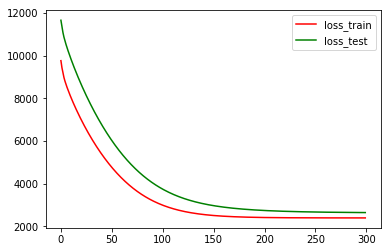

Test MSE: 2642.987                                                                                                     
Test MAE: 42.853                                                                                                       
Test R2: -0.054                                                                                                        
Test RMSE: 51.410                                                                                                      
Accuracy: 0.286                                                                                                        
100%|████████████████████████████████████████| 100/100 [11:45:12<00:00, 423.12s/trial, best loss: -0.35714285714285715]
{'EPOCHS': 300, 'LSTM_Cell_numbers': 2, 'channel_number': 11, 'file_number': 1, 'sample_size': 140, 'seq_len': 37}


In [ ]:
from hyperopt import hp, fmin, tpe, space_eval, rand, Trials, partial, STATUS_OK
def hyperopt_train_test(params):
    
    rmse, mse, mae, r2, acc = main(**params)
    return acc

space = {
    'LSTM_Cell_numbers':hp.choice('LSTM_Cell_numbers',range(1,10)),
    'seq_len':hp.choice('seq_len',range(30,40)),
    'file_number':hp.choice('file_number',[1]),
    'channel_number':hp.choice('channel_number',[11]),
    'sample_size':hp.choice('sample_size',[140]),
    'EPOCHS':hp.choice('EPOCHS',[300])
}

def f(params):
    acc = hyperopt_train_test(params)
    return {'loss':-acc, 'status':STATUS_OK }

trials = Trials()
best = fmin(f, space, algo=tpe.suggest, max_evals=100, trials=trials)
# print('best:\n',best)   
print(space_eval(space,best))
    

In [ ]:
import hyperopt
# define an objective function
def objective(args):X
    case, val = args
    if case == 'case 1':
        return val
    else:
        return val ** 2
 m 
# define a search space
from hyperopt import hp
space = hp.choice('a',
    [
        ('case 1', 1 + hp.lognormal('c1', 0, 1)),
        ('case 2', hp.uniform('c2', -10, 10))
    ])

# minimize the objective over the space
from hyperopt import fmin, tpe, space_eval
best = fmin(objective, space, algo=tpe.suggest, max_evals=100)

print(best)
# -> {'a': 1, 'c2': 0.01420615366247227}
print(space_eval(space, best))
# -> ('case 2', 0.01420615366247227}

100%|█████████████████████████████████████████████| 100/100 [00:00<00:00, 291.77trial/s, best loss: 0.0379775467717912]
{'a': 1, 'c2': -0.1948782870711645}
('case 2', -0.1948782870711645)


## Conv-LSTM模型搭建、训练与验证
（针对多变量）

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import sklearn

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import Masking
from sklearn import preprocessing
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from math import sqrt,exp
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
# from keras.layers import CuDNNLSTM
from tensorflow.compat.v1.keras.layers import CuDNNLSTM
import matplotlib.pyplot as plt
import time
import pytz
from datetime import datetime
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model


def Evaluate_Loss(train_X,train_y,test_X,test_y):
    
    n_timesteps, n_features, n_outputs = train_X.shape[1], train_X.shape[2], train_y.shape[1]

      # Conv-LSTM 
  # 重塑为子序列 (samples, timesteps, rows, cols, channels)
  n_steps, n_length = 20, 18   # 重塑为子序列 (samples, timesteps, rows, cols, channels)
  train_X = train_X.reshape((train_X.shape[0], n_steps, 1, n_length, n_features))
  test_X = test_X.reshape((test_X.shape[0], n_steps, 1, n_length, n_features))

  model = Sequential()
  # model.add(Masking(mask_value=0., input_shape=(n_timesteps, n_features)))
  model.add(ConvLSTM2D(filters=64, kernel_size=(1,3), activation='relu', input_shape=(n_steps, 1, n_length, n_features)))
  model.add(Dropout(0.5))
  model.add(Flatten())
  model.add(Dense(100, activation='relu'))
  model.add(Dense(n_outputs))

  model.compile(loss='mse', optimizer='adam')

    # fit network
    
    history = model.fit(train_X, train_y, epochs=EPOCHS, batch_size=1,\
                      validation_data=(test_X, test_y), verbose=2, shuffle=False)
    print(history.history)

    # plot history
    plt.plot(history.history['loss'], label='loss_train',color='r')
    # plt.plot(history.history['accuracy'], label='accuracy_train',color='b')
    plt.plot(history.history['val_loss'], label='loss_test',color='g')
    # plt.plot(history.history['val_accuracy'], label='accuracy_test',color='p')
    plt.legend()
    plt.savefig(path_root + '/Compresser Stall Problem/Figure/' + bj_time() + '__' + str(EPOCHS) + '__loss_and_val_loss_curve.svg')
    plt.savefig(path_root + '/Compresser Stall Problem/Figure/' + bj_time() + '__' + str(EPOCHS) + '__loss_and_val_loss_curve.png')
    plt.show()

    # save model
    # 保存模型 model.save(file_path)
    model_dir = path_root + '/Compresser Stall Problem'
    LSTM_dir = '{}/model/'.format(model_dir) + bj_time() + '__' + str(EPOCHS) + '__' + 'LSTM_model.h5'
    model.save(LSTM_dir)

    # draw the diagram of model topology
    # 保存模型图

    # 需要安装pip install pydot

    LSTM_plot_dir = '{}/model_Figure/'.format(model_dir) + bj_time() + '__' + str(EPOCHS) + '__' + 'LSTM_model_Figure.png'
    plot_model(model, to_file=LSTM_plot_dir, show_shapes=True)

    # make a prediction
    pred_y = model.predict(test_X)
    # print(pred_y)
    # calculate MSE、MAE、R2、RSME、offical_score

    mse = mean_squared_error(test_y, pred_y)  # 此处的mse=history.history['val_loss'][-1]
    print('Test MSE: %.3f' % mse)

    mae = mean_absolute_error(test_y, pred_y)    
    print('Test MAE: %.3f' % mae)

    r2 = r2_score(test_y, pred_y)    
    print('Test R2: %.3f' % r2)

    rmse = sqrt(mean_squared_error(test_y, pred_y))    
    print('Test RMSE: %.3f' % rmse)

    count_number = 0
    for i in range(len(pred_y)):
        if abs(pred_y[i]-test_y[i][0]) <=5:
            count_number = count_number + 1
    acc = float(count_number)/len(pred_y)
    print('Accuracy: %.3f' % acc)
    # acc = 0.9
    return rmse, mse, mae, r2, acc 

EPOCHS = 2
global EPOCHS
channel_number = 11
X_train, y_train, X_test, y_test = single_dataset_generator(channel_number)
rmse, mse, mae, r2, acc = Evaluate_Loss(X_train, y_train, X_test, y_test)

def generate_loss_csv(channel_number):
    df_loss = pd.DataFrame(index = ['rmse', 'mse', 'mae', 'r2', 'Acc'])
    X_train, y_train, X_test, y_test = single_dataset_generator(channel_number)
    rmse, mse, mae, r2, acc = Evaluate_Loss(X_train, y_train, X_test, y_test)
    df_loss[channel_number] = [rmse, mse, mae, r2, acc]
    df_loss.to_csv(path_root + '/Compresser Stall Problem/loss/' + bj_time() + '__' + str(EPOCHS) + '__LSTM_losses.csv')
    return rmse, mse, mae, r2, acc

# EPOCHS = 20
# global EPOCHS
# generate_loss_csv(sm_columns)
# generate_loss_csv(11)

## 待用/弃用的函数和代码

## 存在的问题和可能的解决办法

归一化可能也会对结果产生影响：https://blog.csdn.net/qq_35649669/article/details/86756343